<h1> From Motions to Actions </h1>

<h2> Data Preprocessing </h2>

In [6]:
import pandas as pd 
import numpy as np
import scipy as sp


from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn import cross_validation
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from scipy.fftpack import fft
from sklearn import metrics
from sklearn.metrics import confusion_matrix


In [7]:
#reading my CSV files from computer 

sittingdata = pd.read_csv("/Users/nathanrice/Downloads/static.csv")
walkingdata = pd.read_csv("/Users/nathanrice/Downloads/walking.csv")
stairsdata = pd.read_csv("/Users/nathanrice/Downloads/upstair.csv")
runningdata = pd.read_csv("/Users/nathanrice/Downloads/running.csv")
drivingdata = pd.read_csv("/Users/nathanrice/Downloads/driving.csv")
heartratedata = pd.read_csv("/Users/nathanrice/Downloads/heartrate.csv")

#extracting four minutes of data 
sittingtrain = sittingdata.iloc[0:24000]
walkingtrain = walkingdata.iloc[0:24000]
stairstrain = stairsdata.iloc[0:24000]
runningtrain = runningdata.iloc[0:24000]
drivingtrain = drivingdata.iloc[0:24000]

#extracting one minute of test data

sittingtest = sittingdata.iloc[24000:30000]
walkingtest = walkingdata.iloc[24000:30000]
stairstest = stairsdata.iloc[24000:30000]
runningtest = runningdata.iloc[24000:30000]
drivingtest = drivingdata.iloc[24000:30000]

#appending training and test data all together.

traindata = sittingtrain.append(walkingtrain).append(stairstrain).append(runningtrain).append(drivingtrain)
testdata = sittingtest.append(walkingtest).append(stairstest).append(runningtest).append(drivingtest)

traindata.shape

#performing a test display to make sure I pulled in the correct data
#sittingdata.head() #displays the first five rows

(120000, 16)

In [8]:
import seaborn as sb

%matplotlib inline

<h3> Attitude Roll </h3>

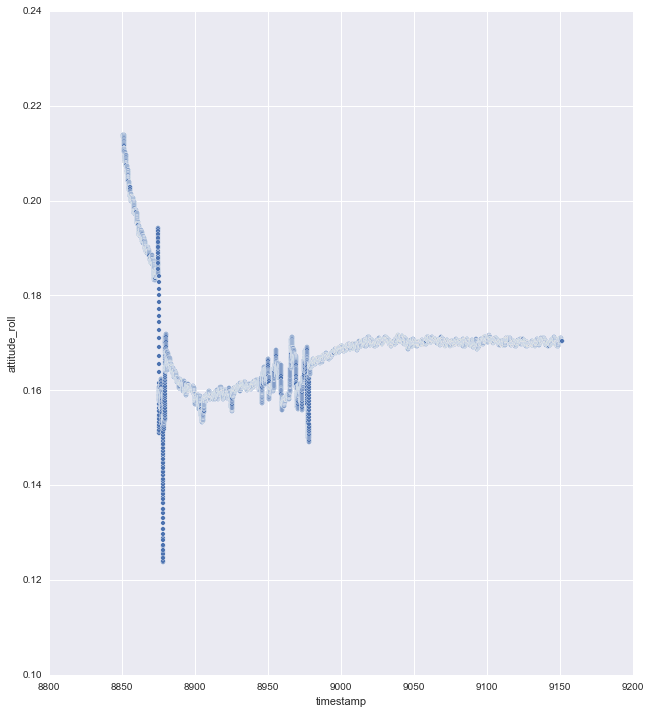

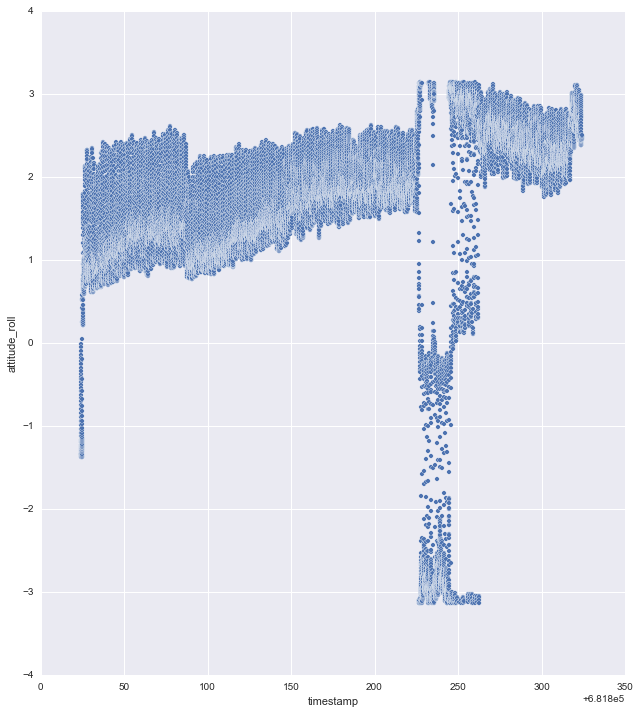

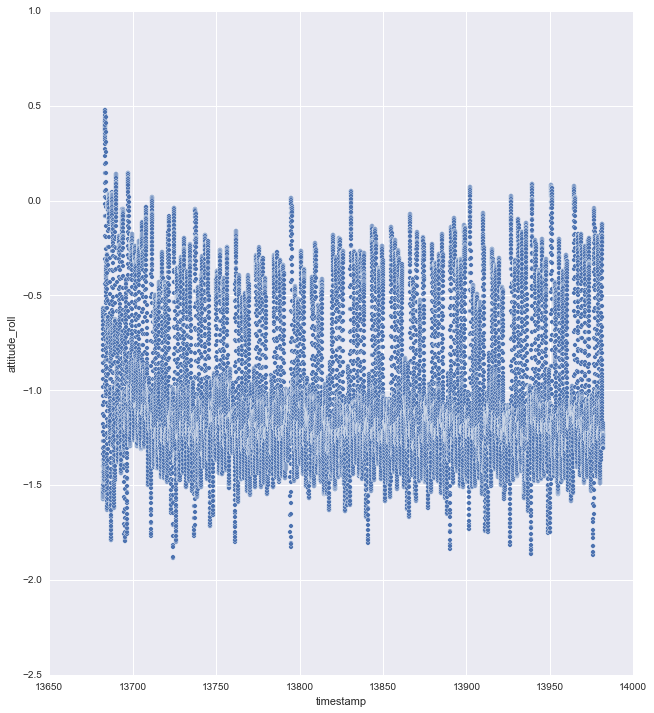

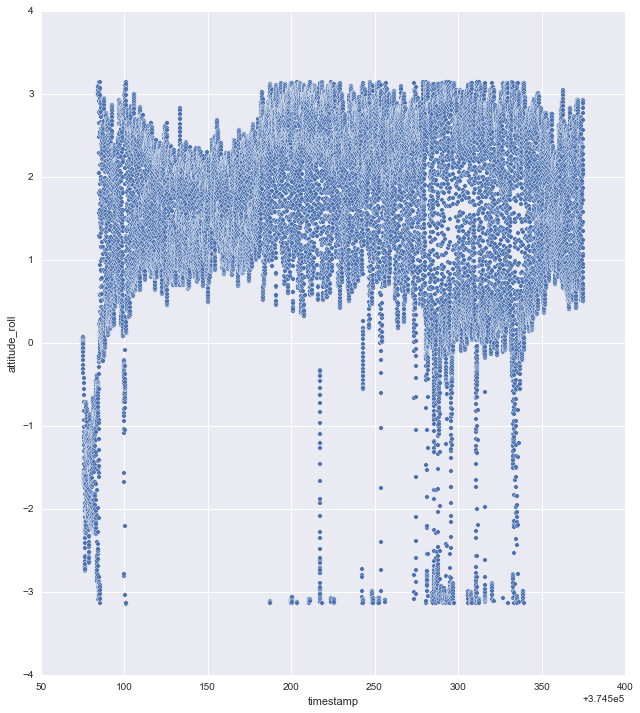

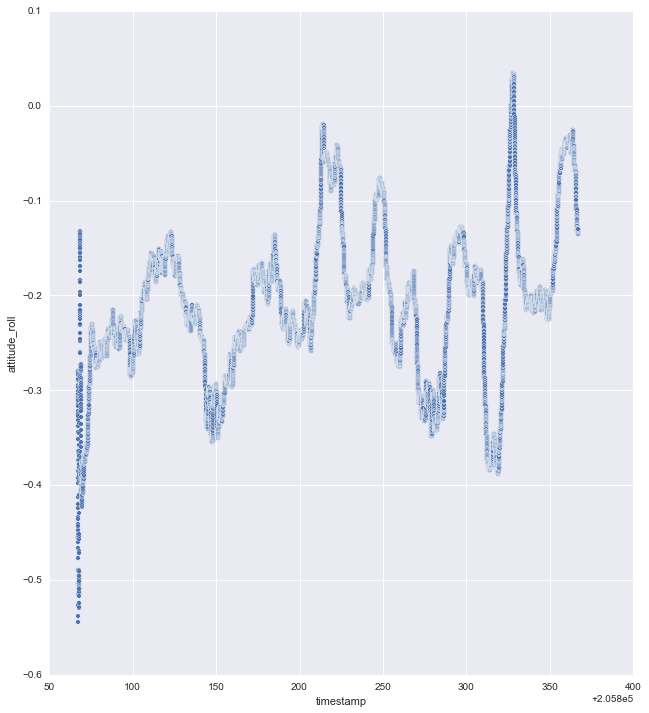

In [9]:
#comparative plotting for each column for each activity
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'attitude_roll', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'attitude_roll', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'attitude_roll', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'attitude_roll', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'attitude_roll', size = 10, aspect=0.9)


<h3> Attitude Pitch </h3>

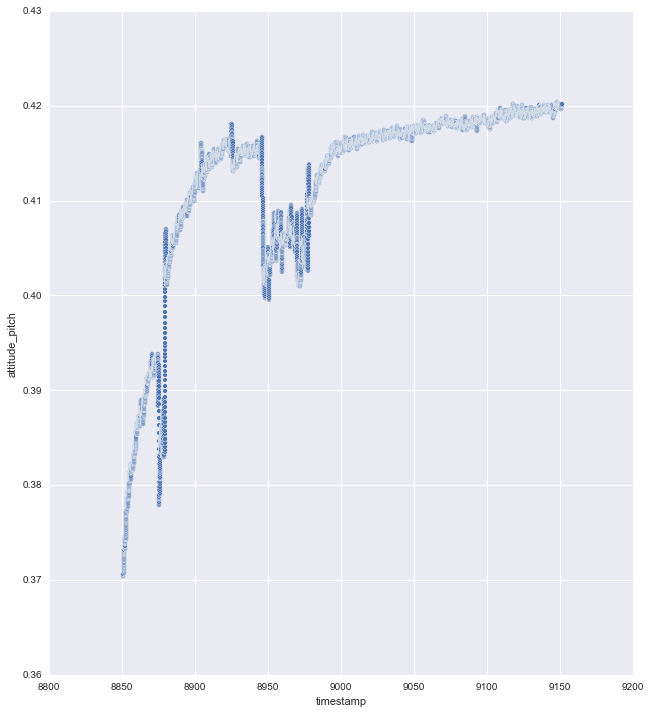

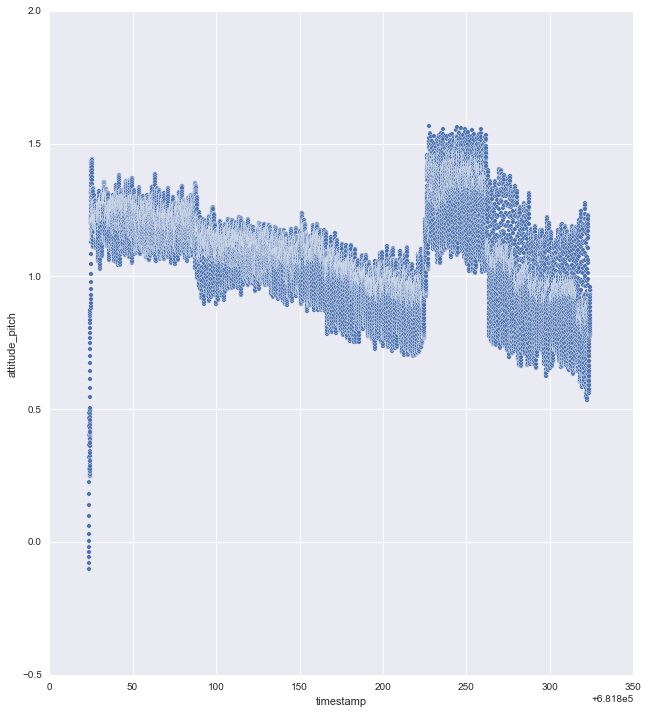

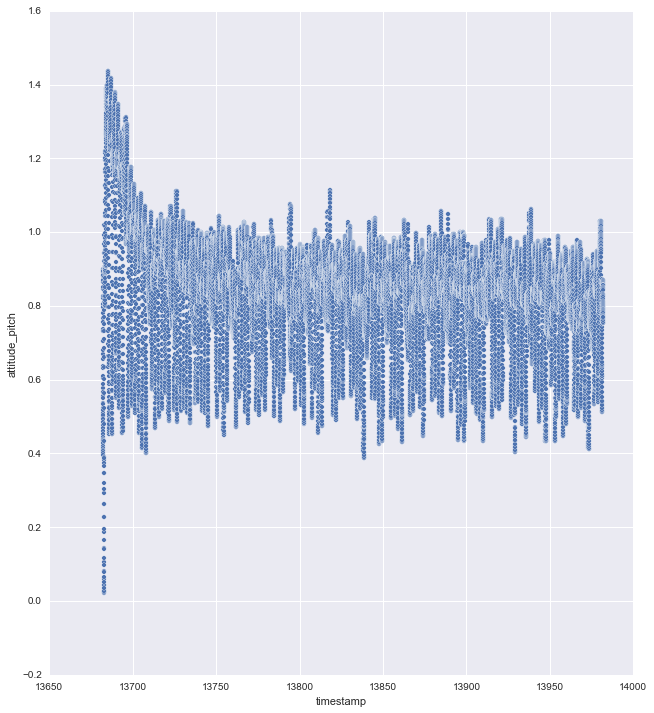

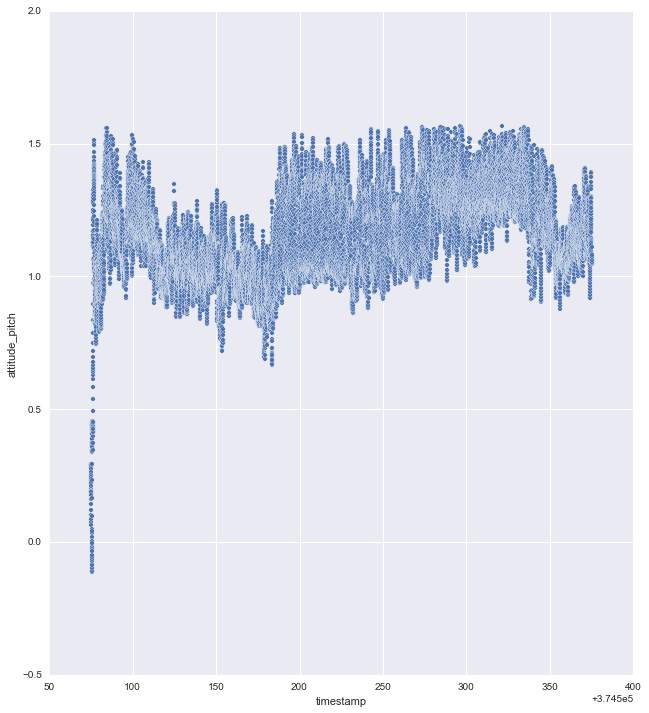

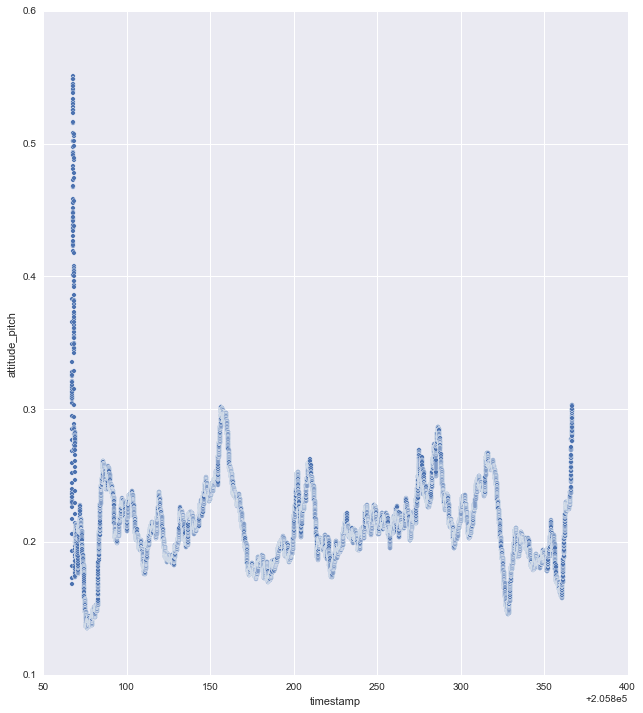

In [10]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'attitude_pitch', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'attitude_pitch', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'attitude_pitch', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'attitude_pitch', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'attitude_pitch', size = 10, aspect=0.9)


<h2> Attitude Yaw </h3>

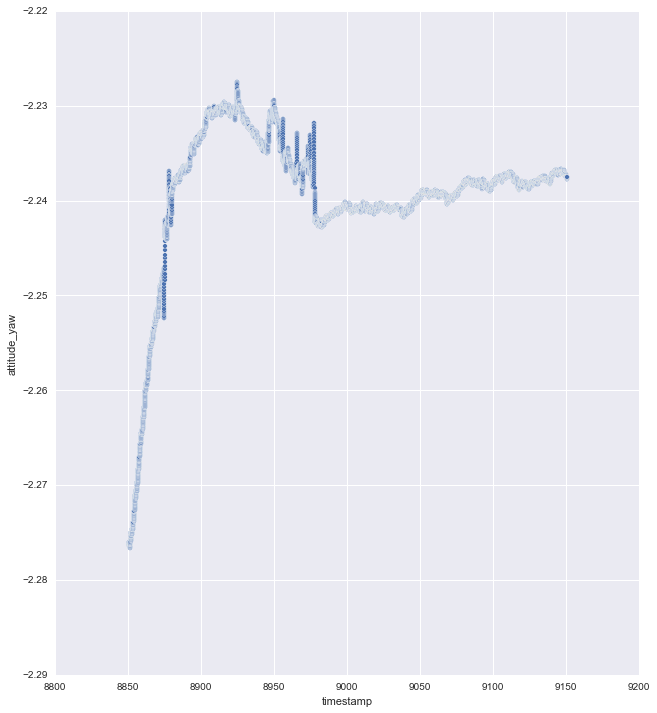

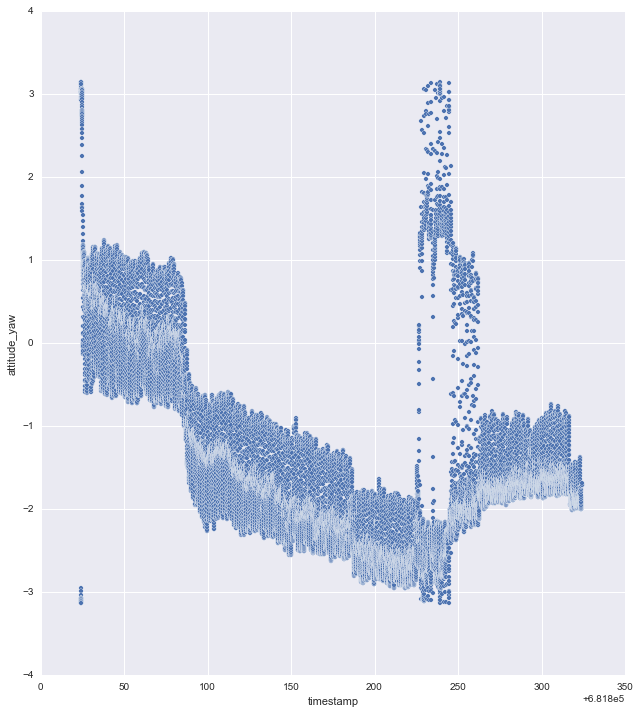

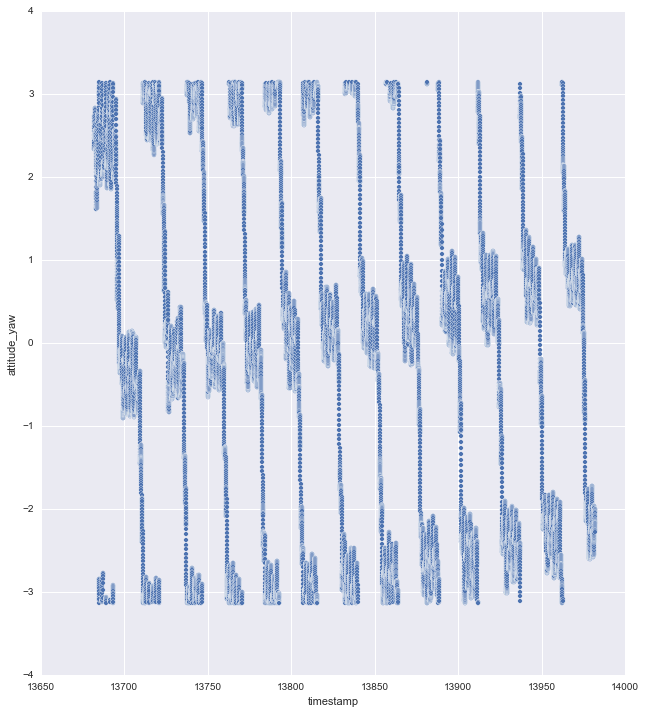

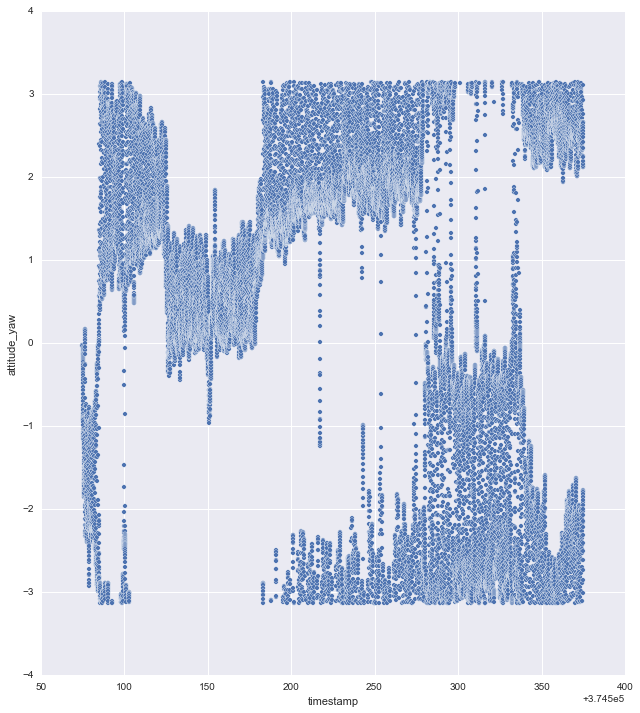

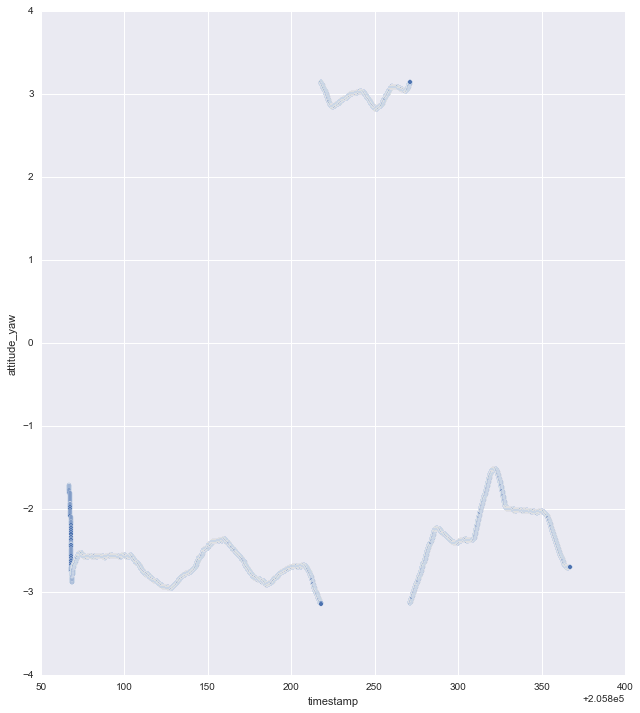

In [11]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'attitude_yaw', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'attitude_yaw', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'attitude_yaw', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'attitude_yaw', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'attitude_yaw', size = 10, aspect=0.9)


<h3> Rotation Rate X </h3>

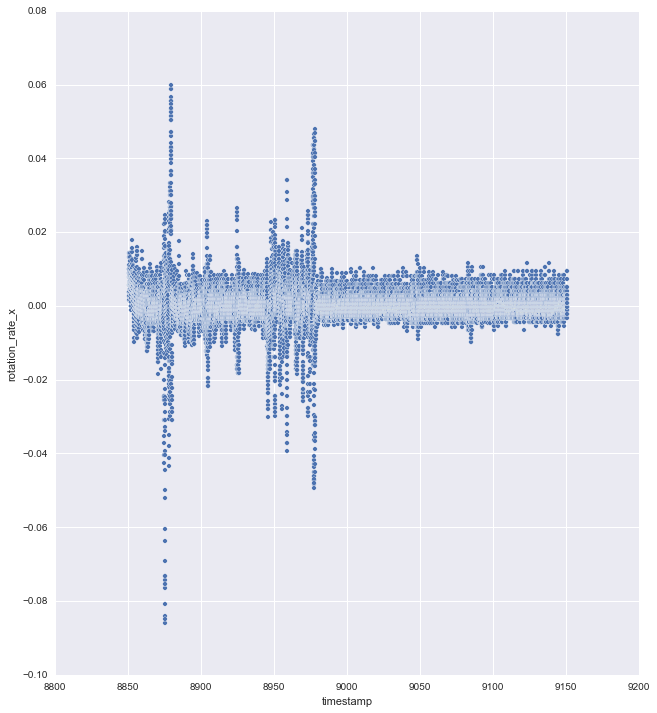

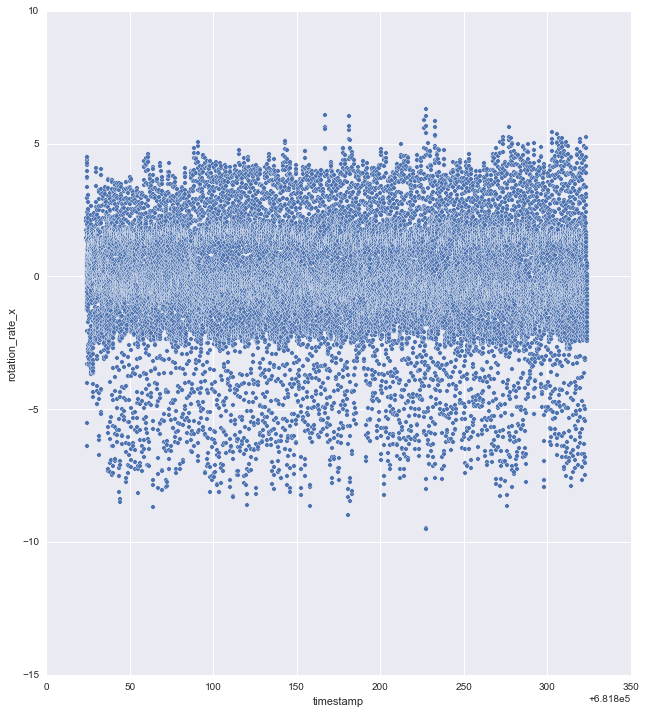

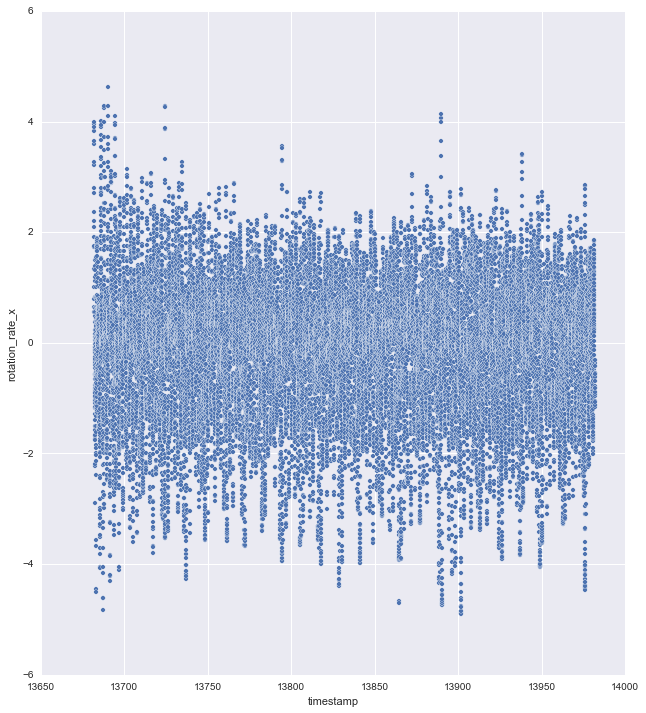

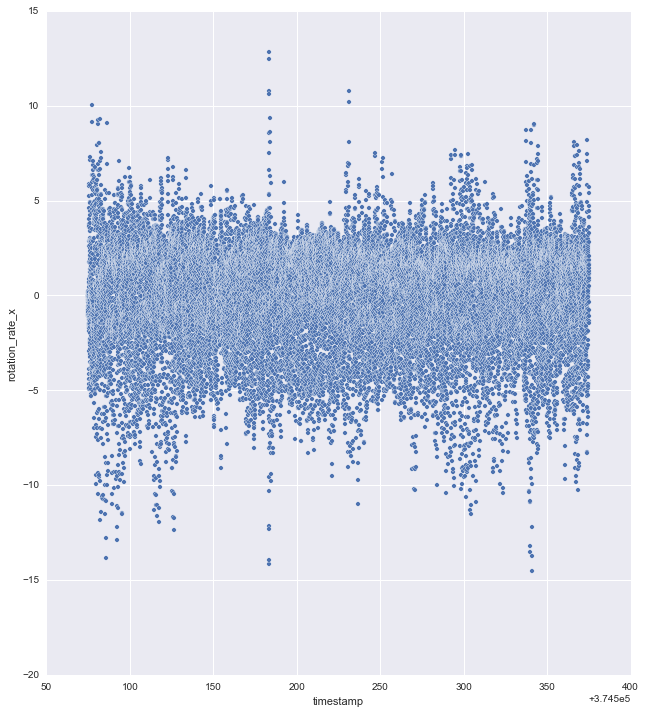

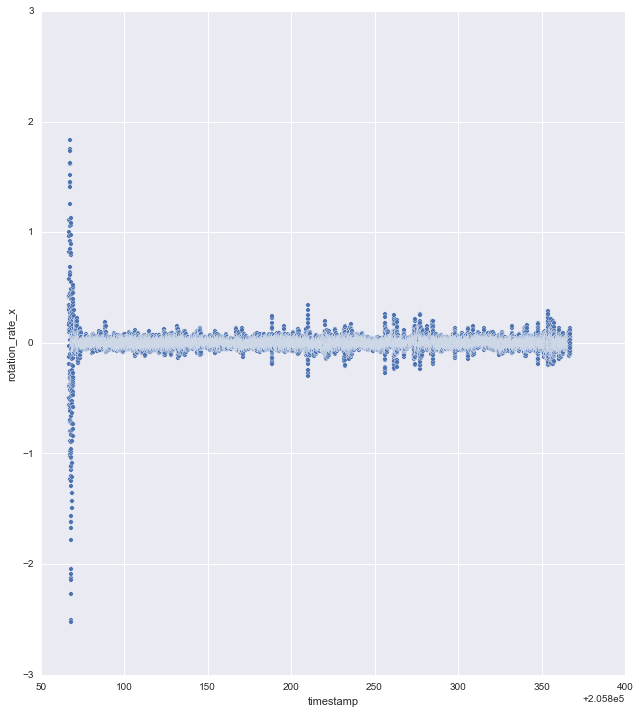

In [12]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_x', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_x', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'rotation_rate_x', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'rotation_rate_x', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_x', size = 10, aspect=0.9)


<h3> Rotation Rate Y </h3>

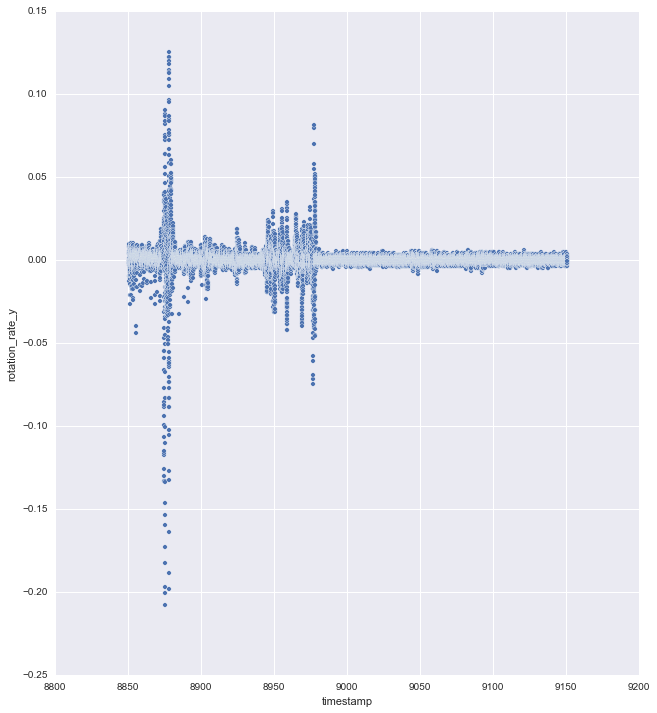

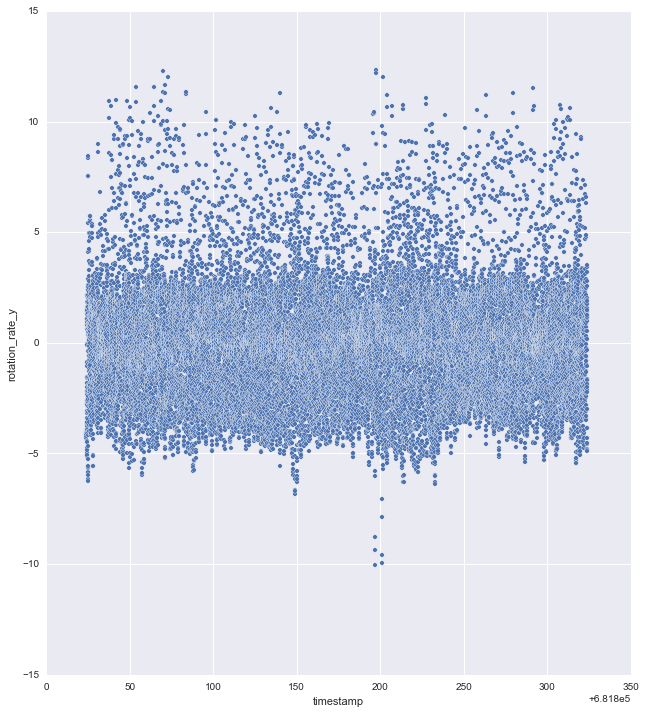

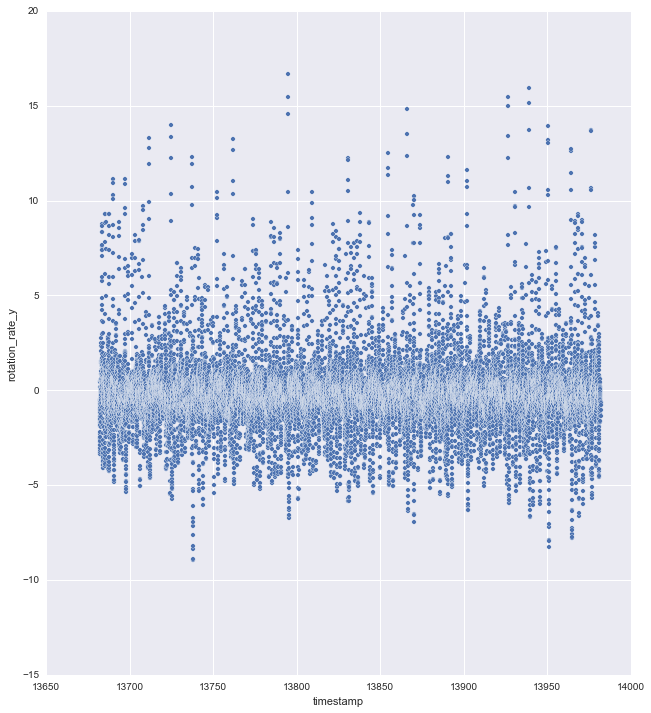

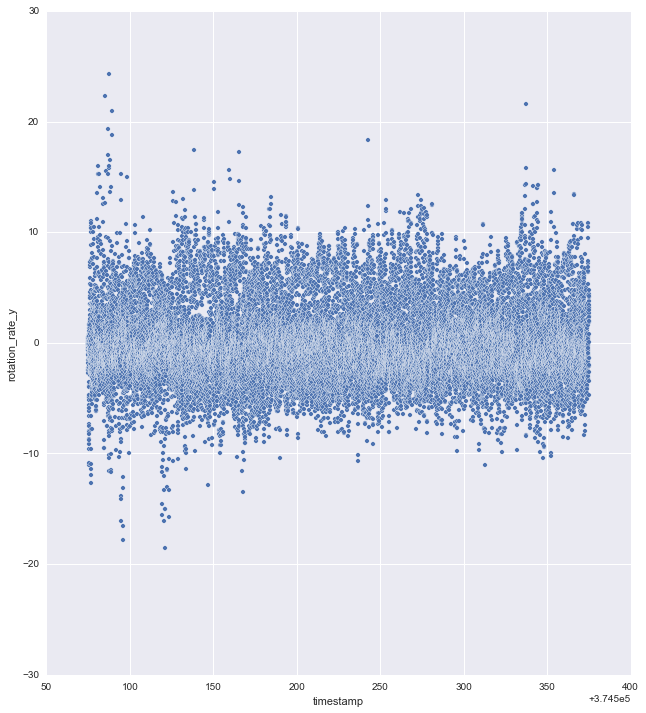

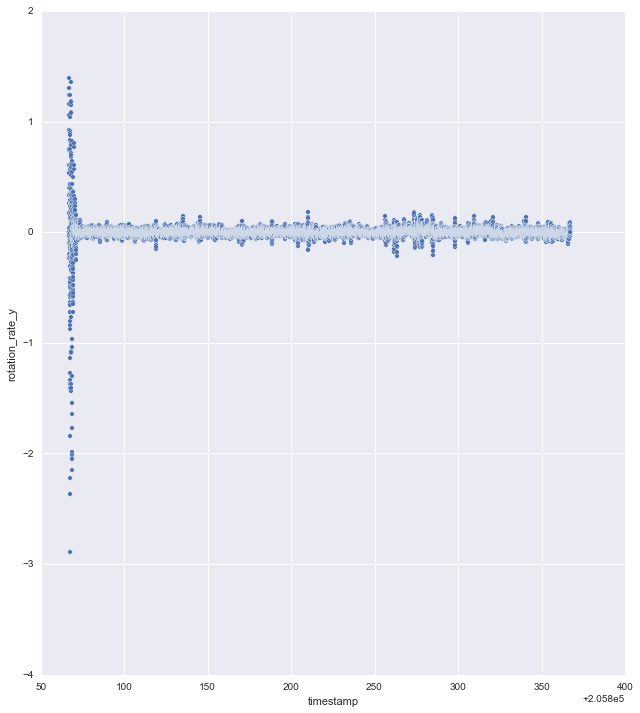

In [13]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_y', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_y', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'rotation_rate_y', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'rotation_rate_y', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_y', size = 10, aspect=0.9)


<h3> Rotation Rate Z </h3>

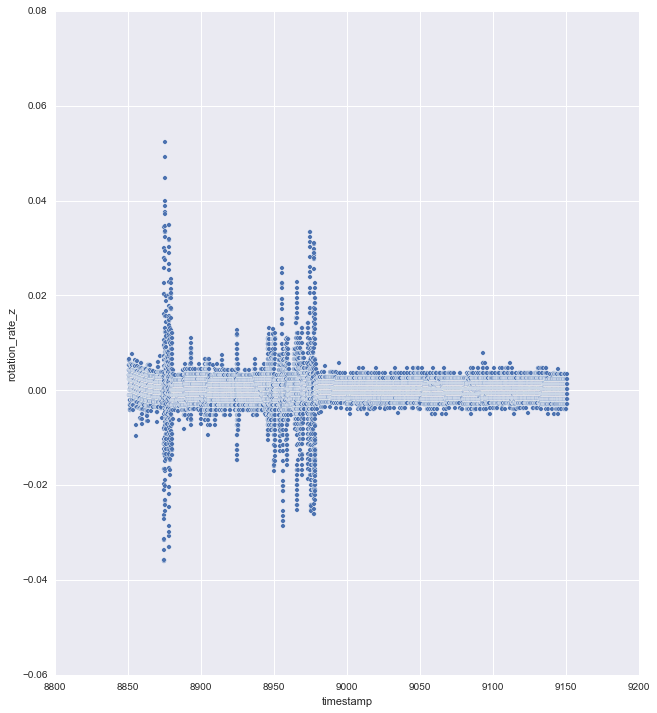

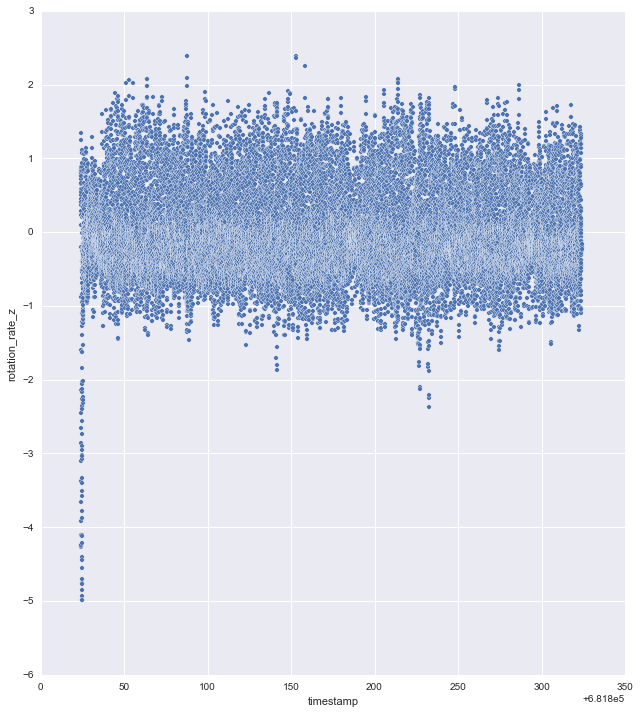

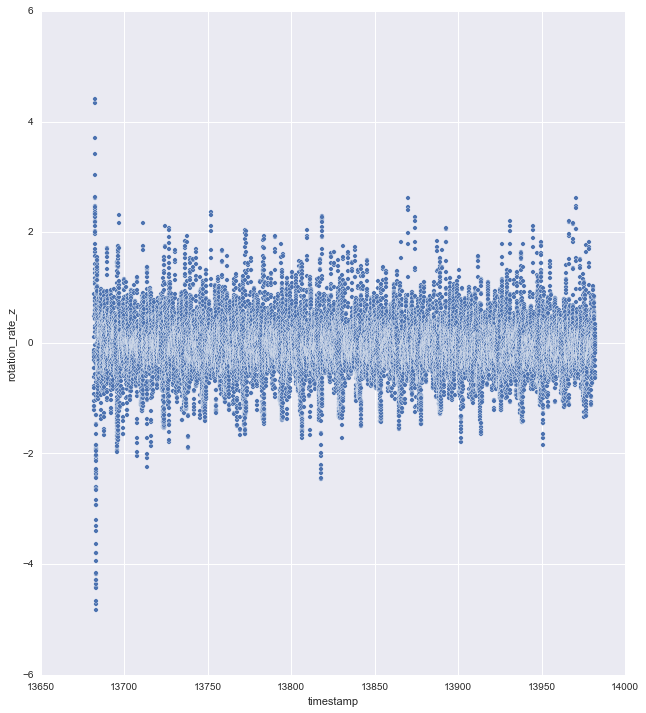

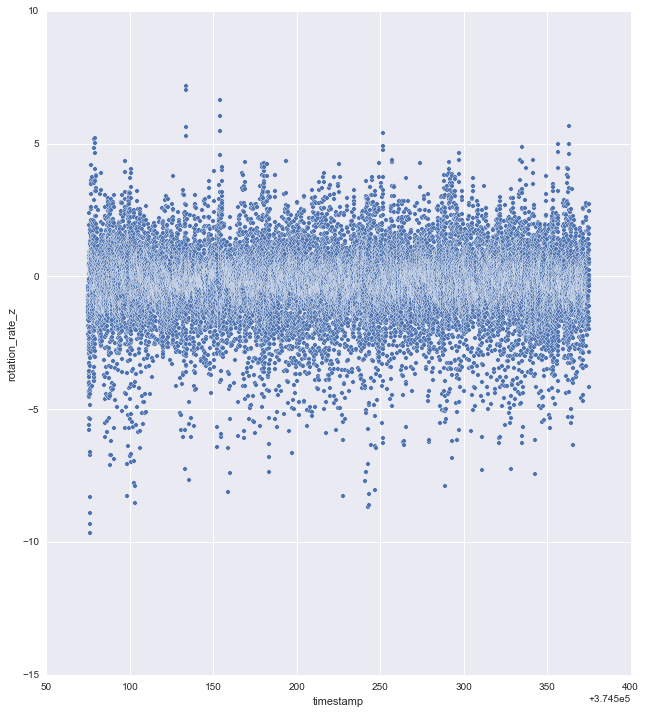

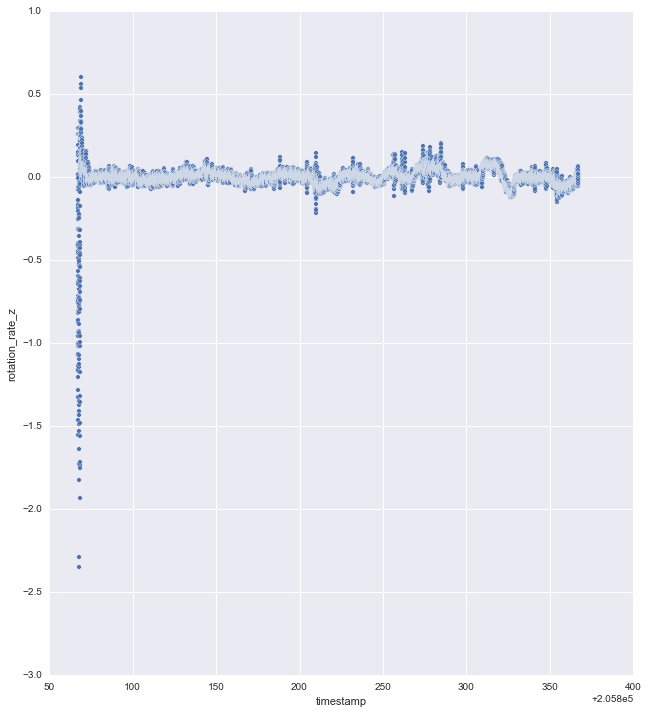

In [14]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_z', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_z', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'rotation_rate_z', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'rotation_rate_z', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'rotation_rate_z', size = 10, aspect=0.9)


<h3> Gravity X </h3>

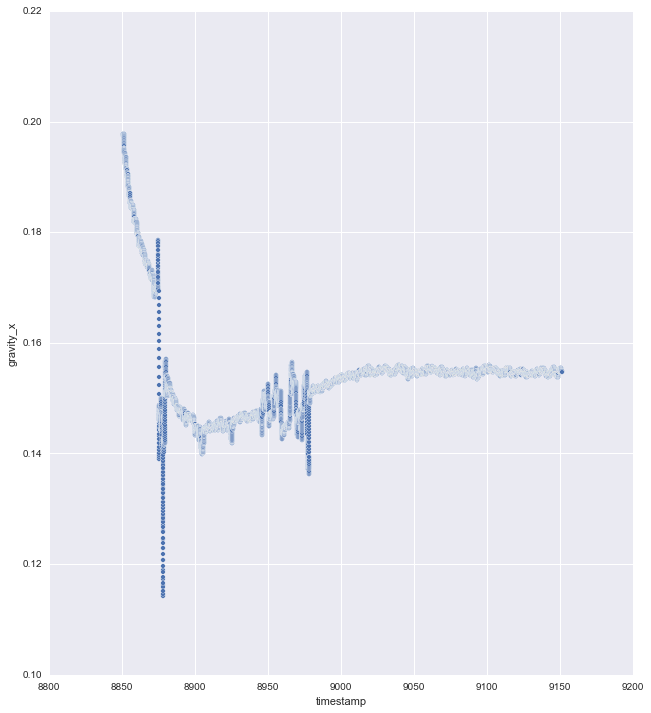

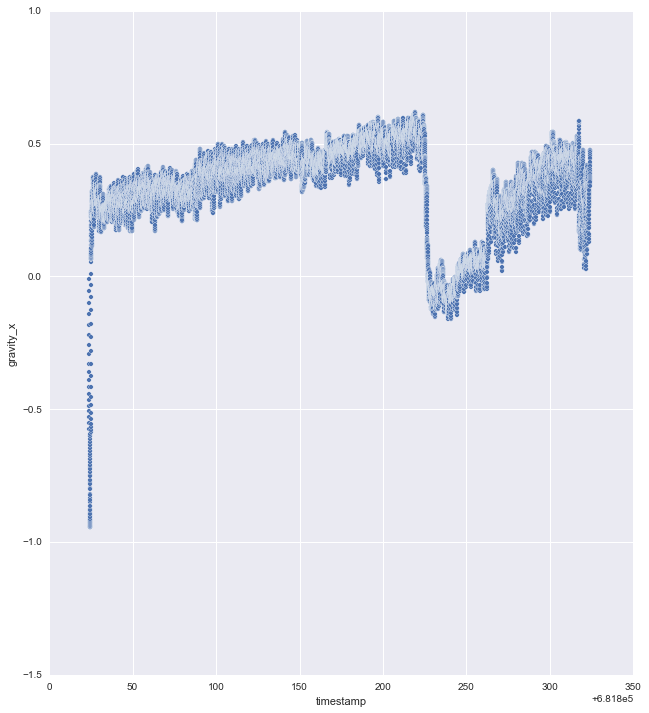

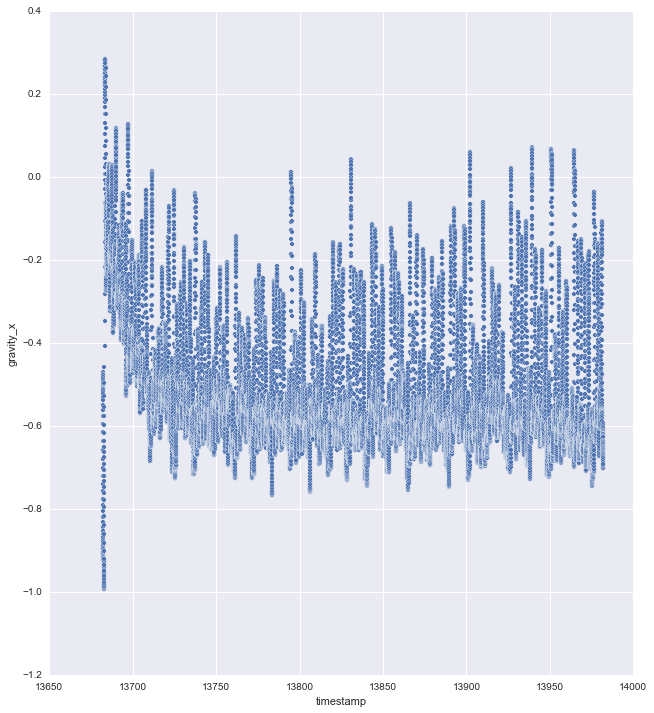

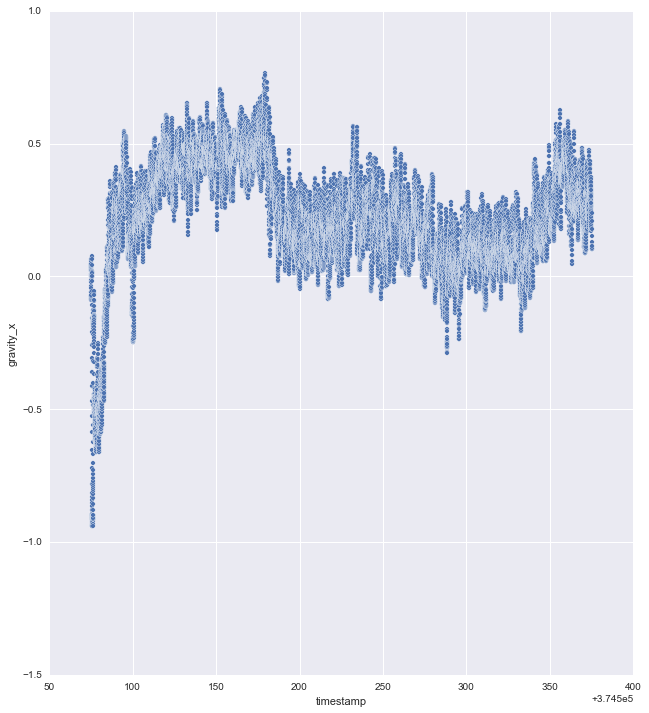

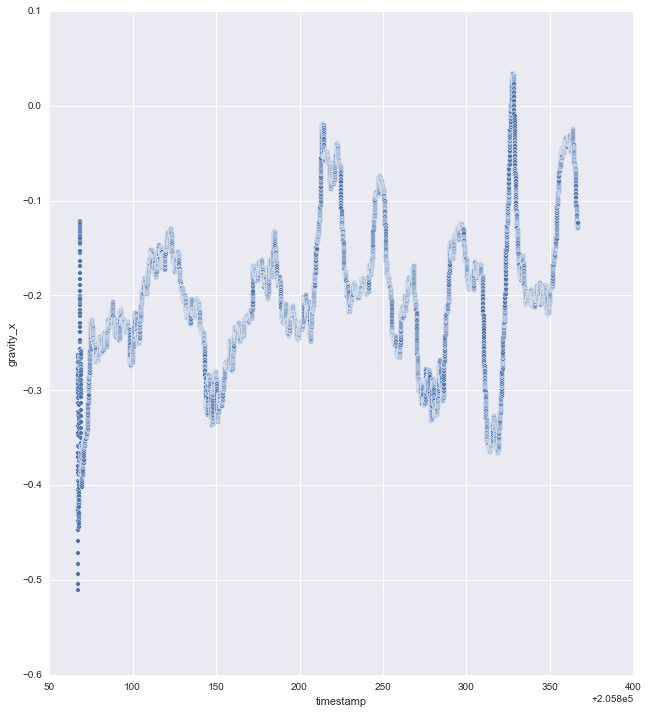

In [17]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)


<h3> Gravity Y </h3>

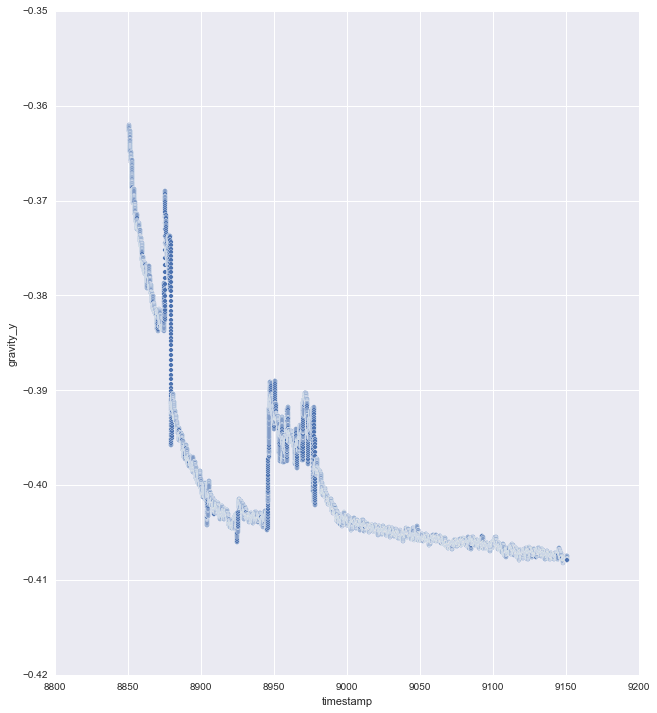

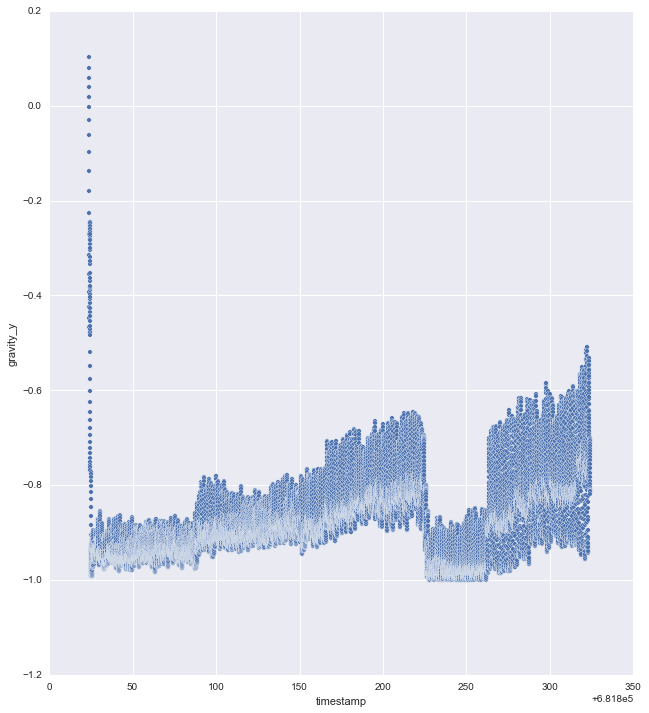

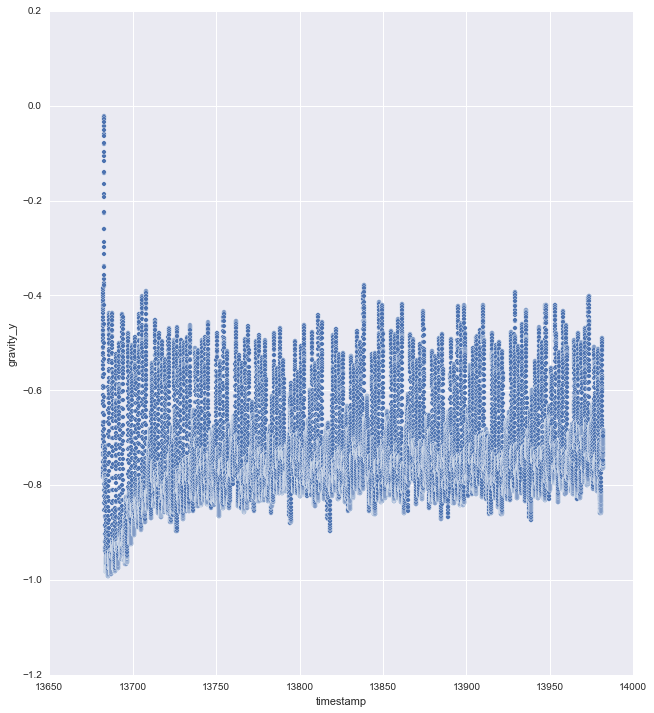

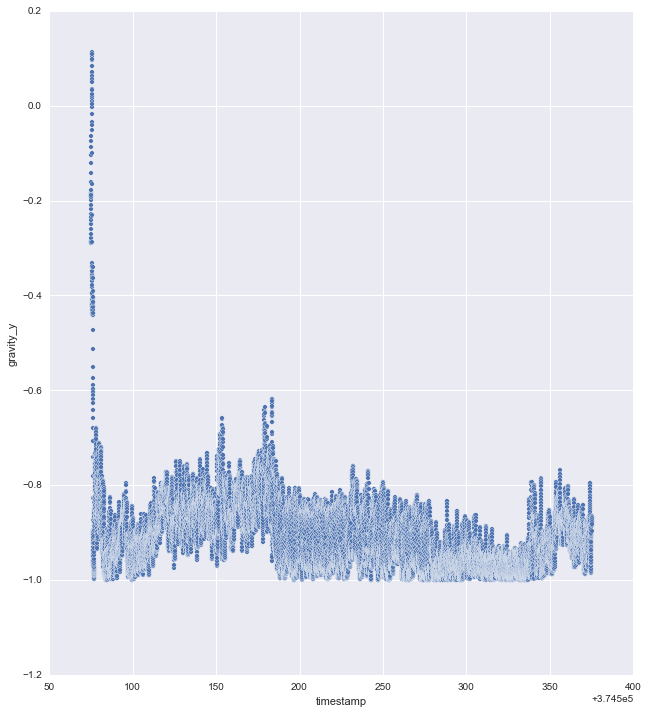

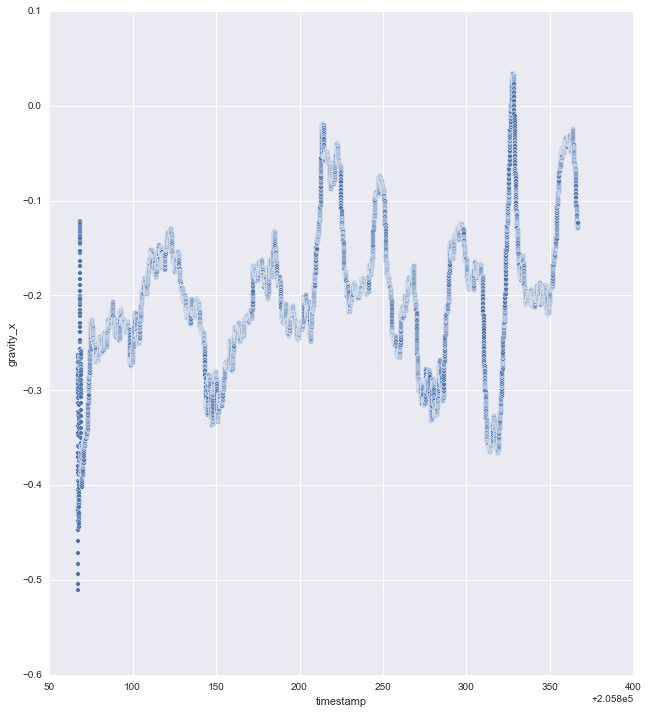

In [16]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'gravity_y', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'gravity_y', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'gravity_y', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'gravity_y', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)


<h3> Gravity Z </h3>

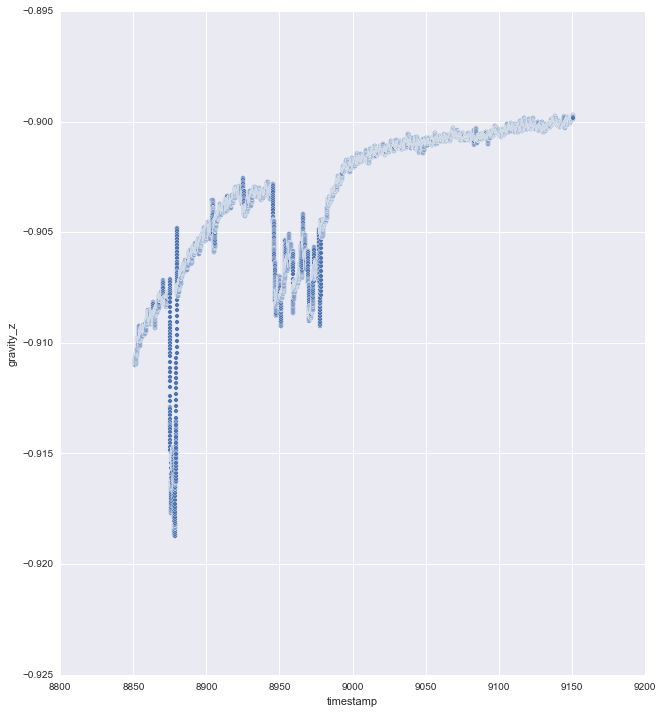

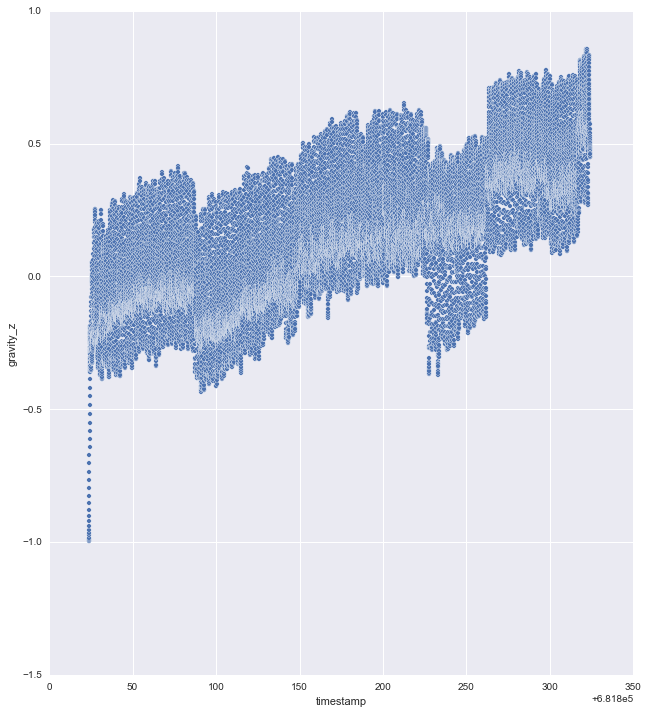

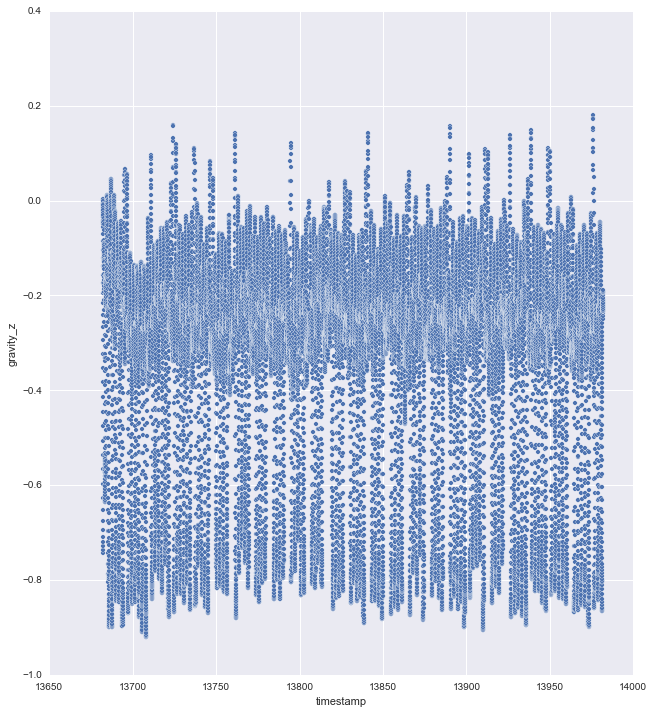

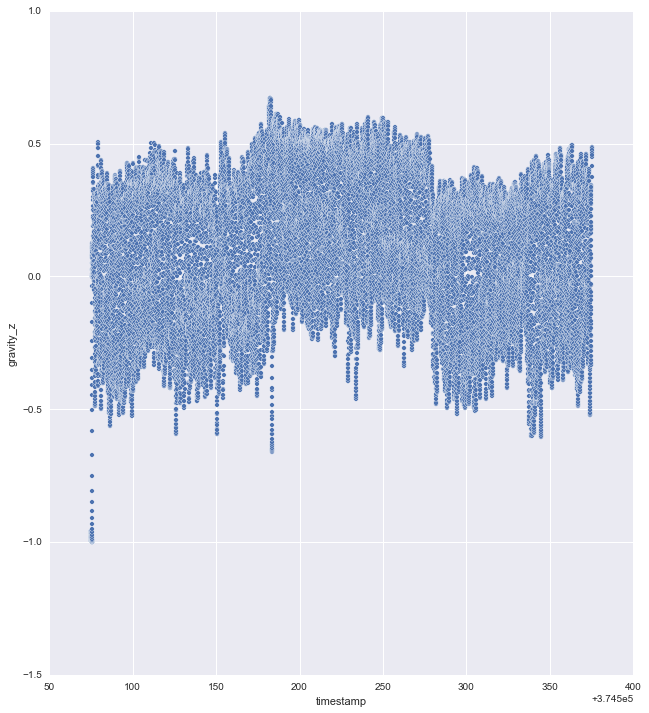

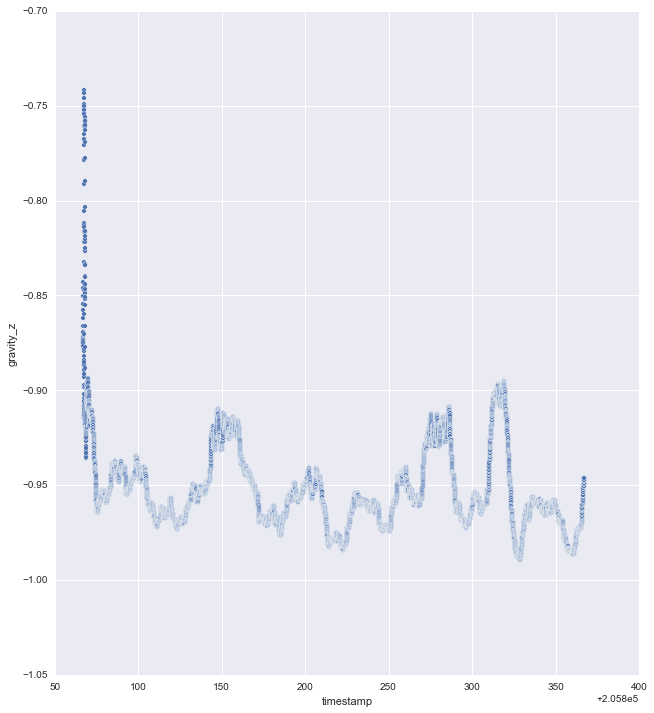

In [18]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'gravity_z', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'gravity_z', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'gravity_z', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'gravity_z', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'gravity_z', size = 10, aspect=0.9)


<h3> User Acc X </h3>

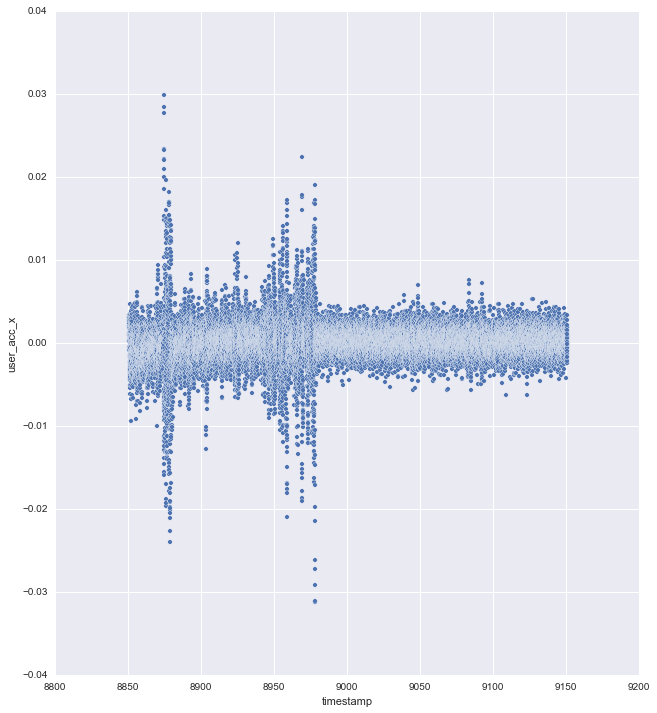

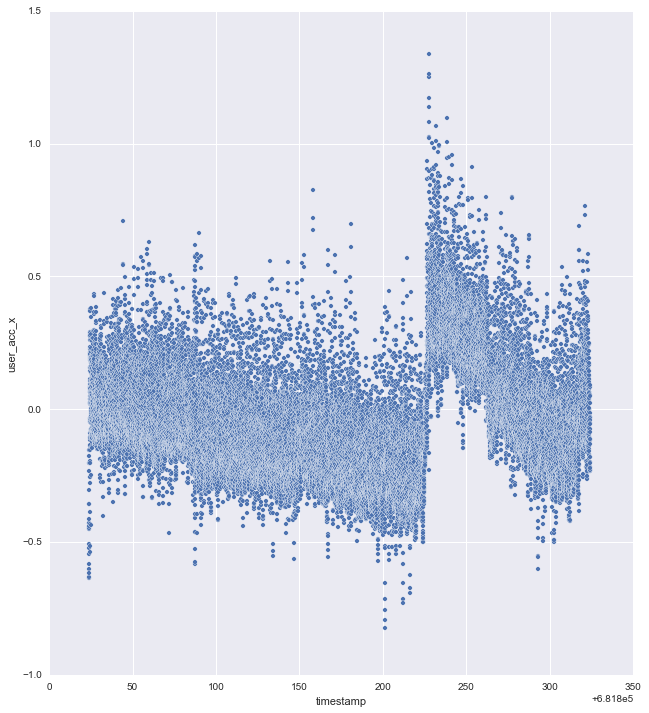

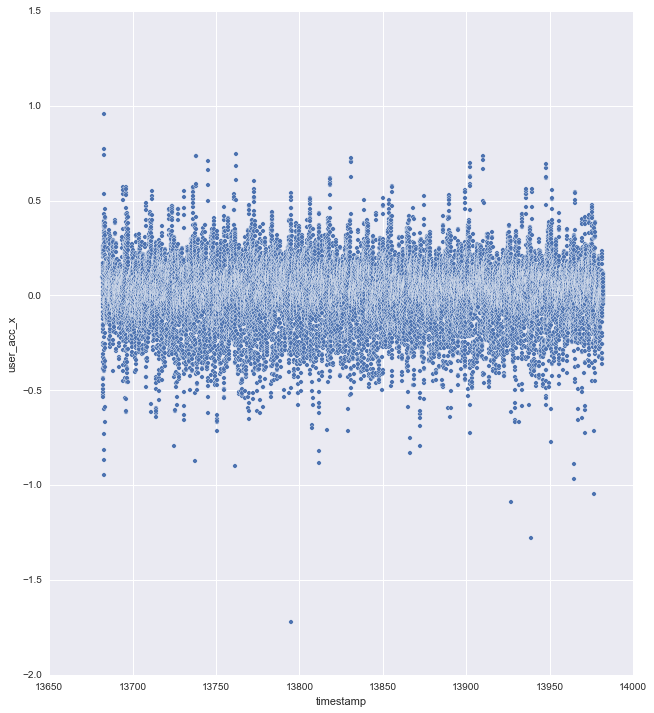

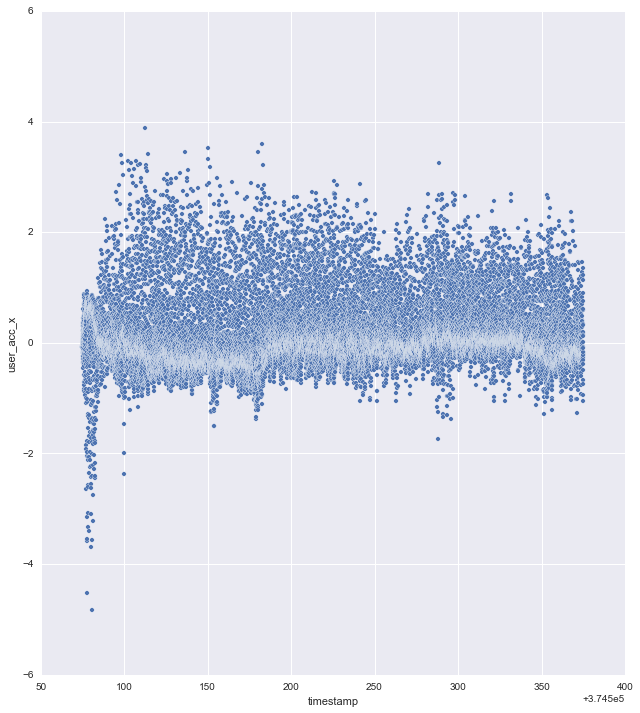

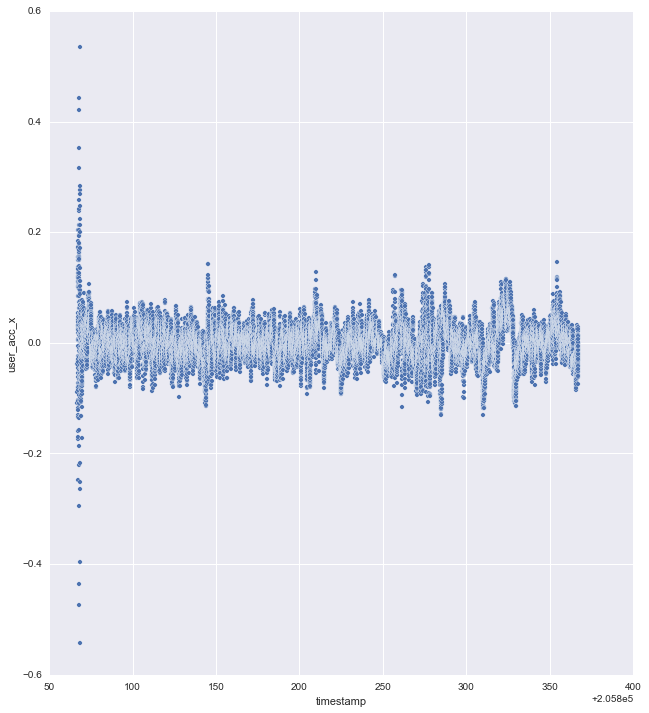

In [19]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'user_acc_x', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'user_acc_x', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'user_acc_x', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'user_acc_x', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'user_acc_x', size = 10, aspect=0.9)


<h3> User Acc Y </h3>

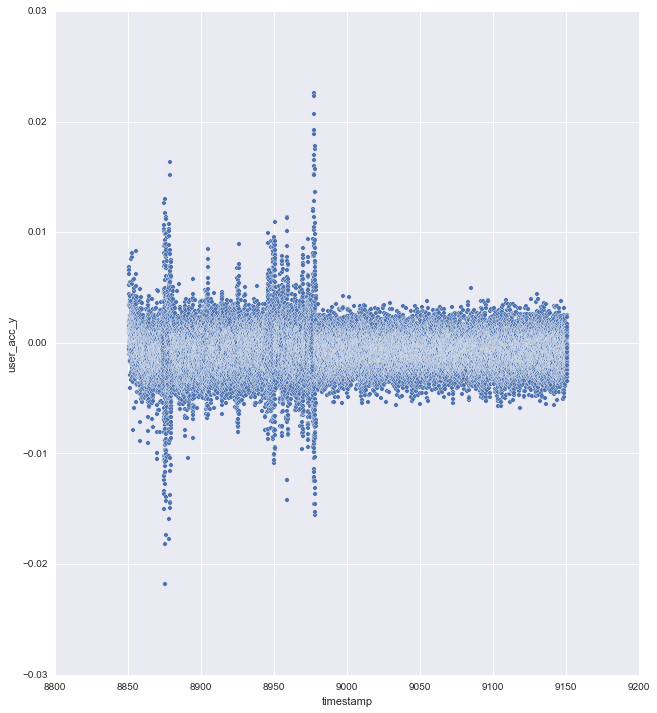

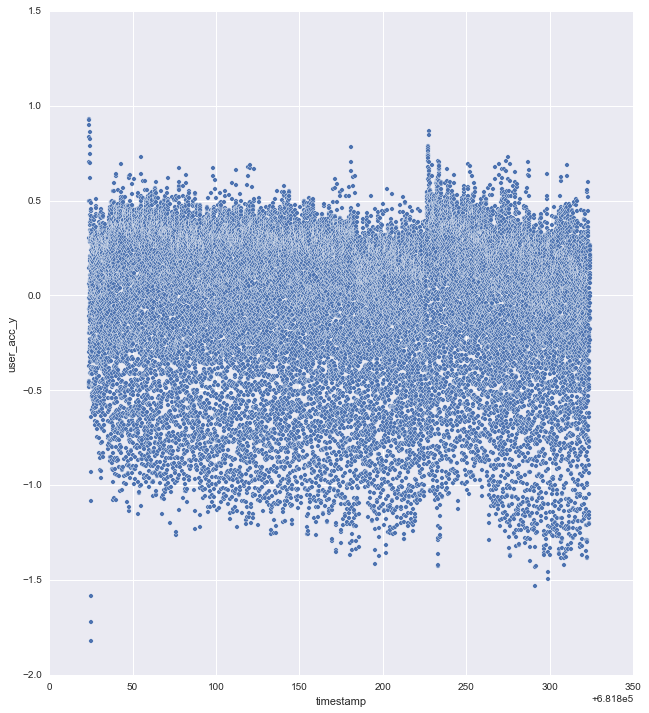

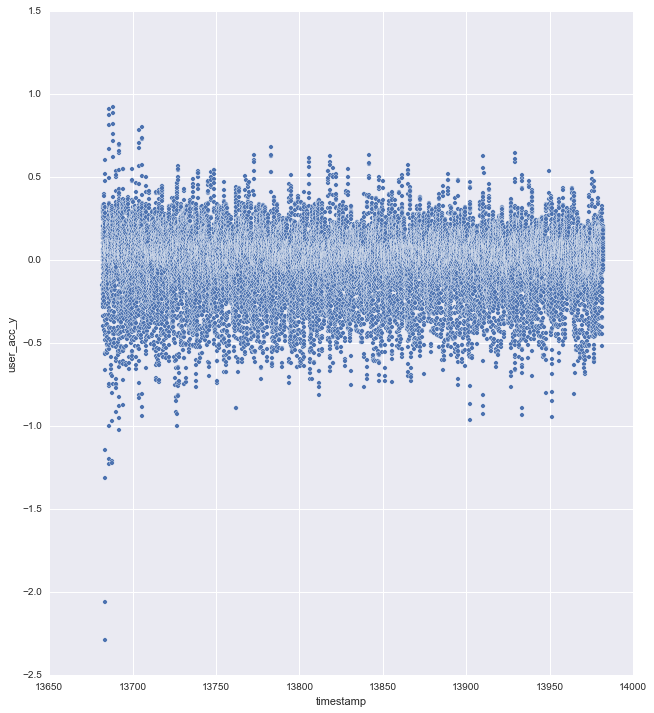

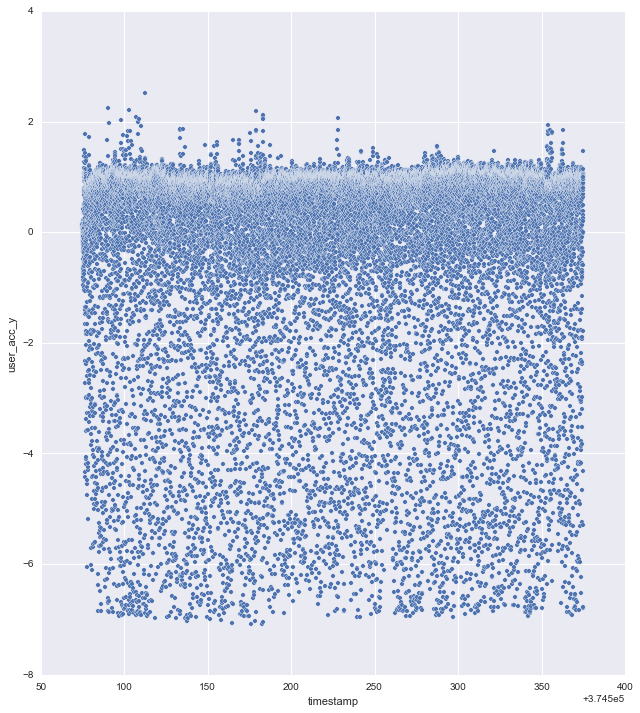

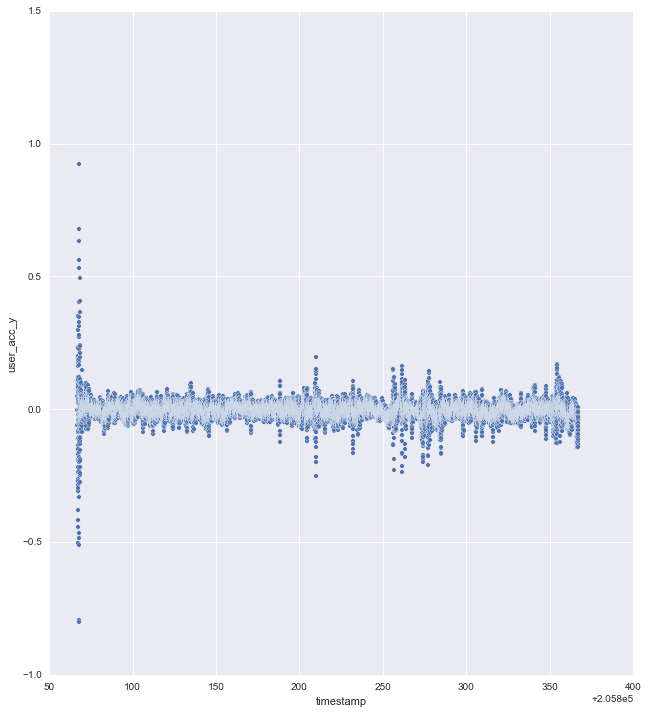

In [20]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'user_acc_y', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'user_acc_y', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'user_acc_y', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'user_acc_y', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'user_acc_y', size = 10, aspect=0.9)


<h3> User Acc Z </h3>

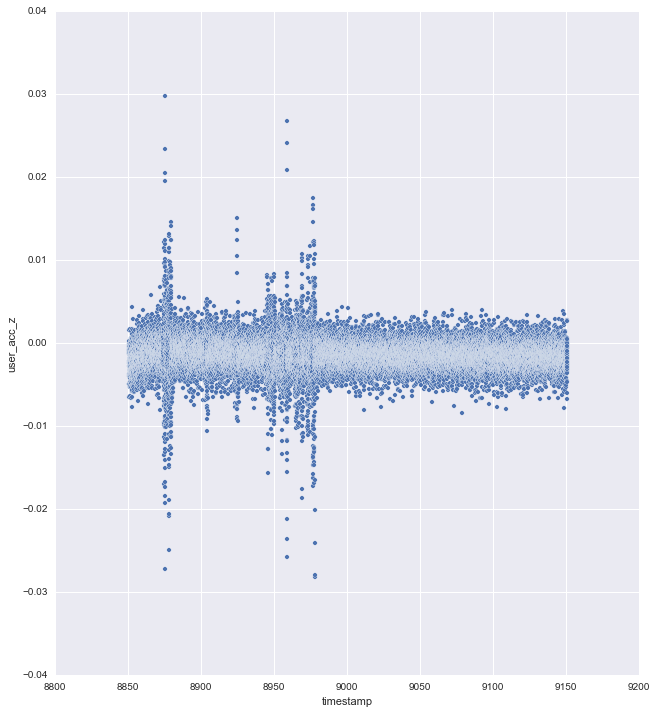

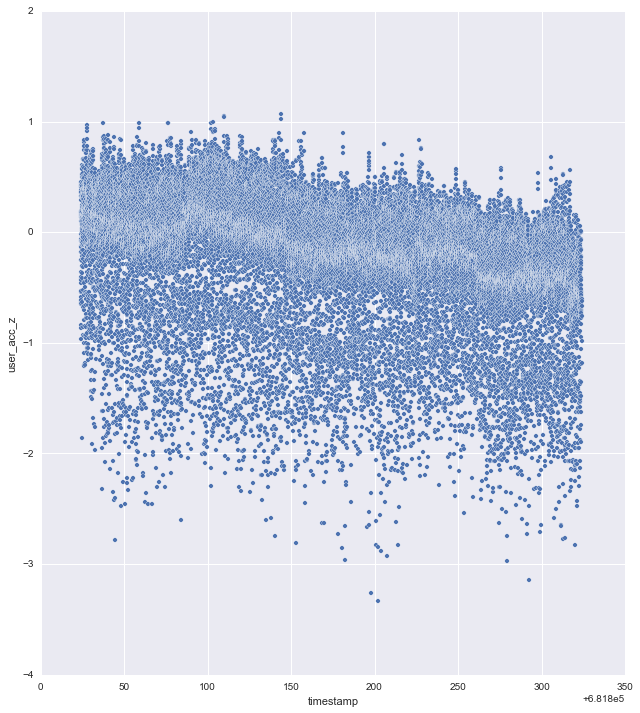

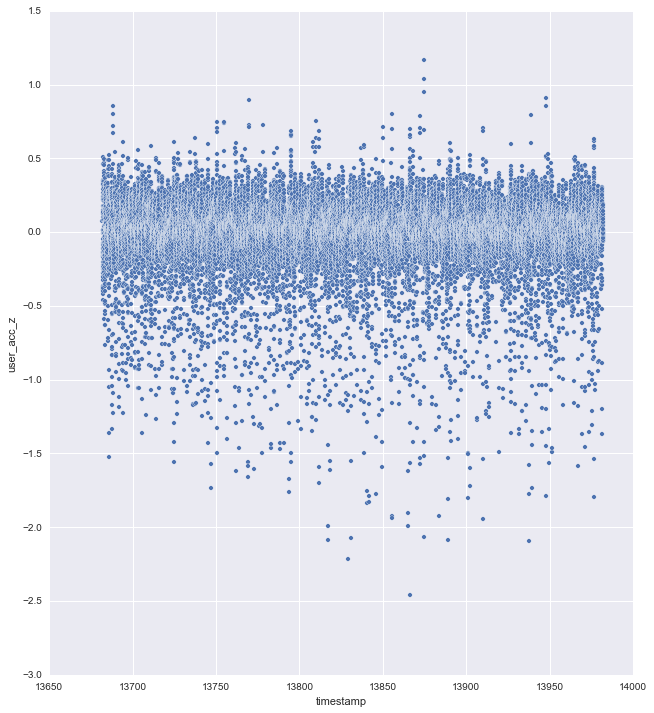

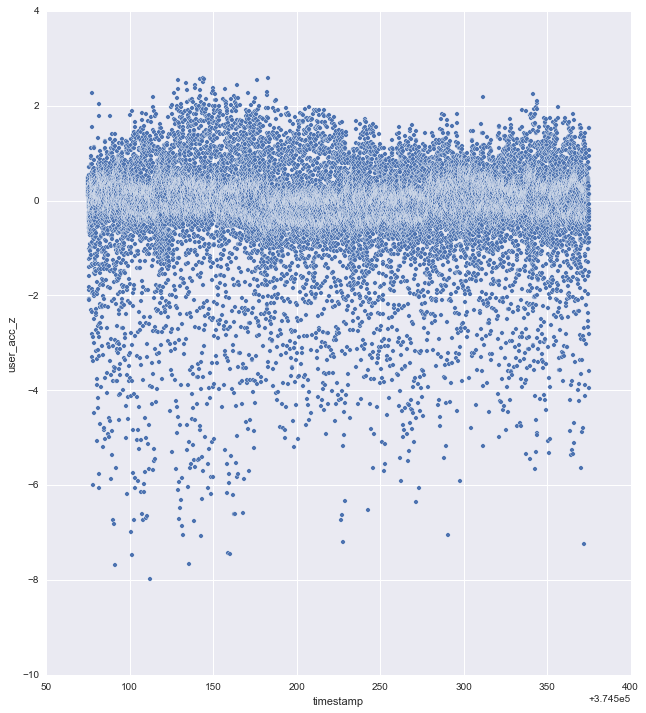

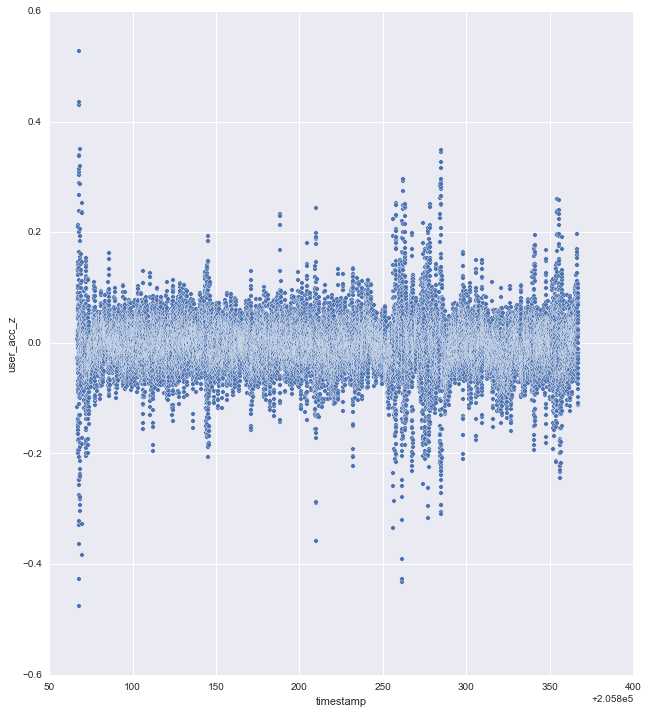

In [21]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'user_acc_z', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'user_acc_z', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'user_acc_z', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'user_acc_z', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'user_acc_z', size = 10, aspect=0.9)


<h3> Magnetic Field X </h3>

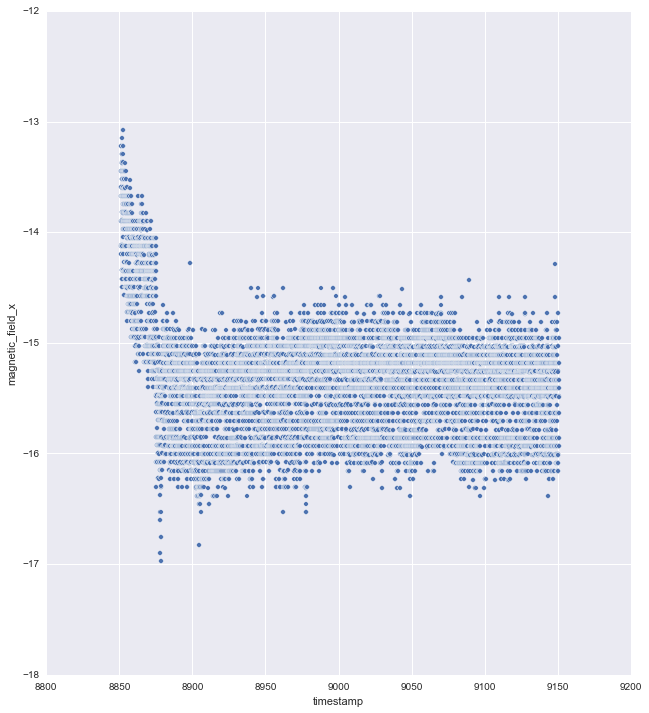

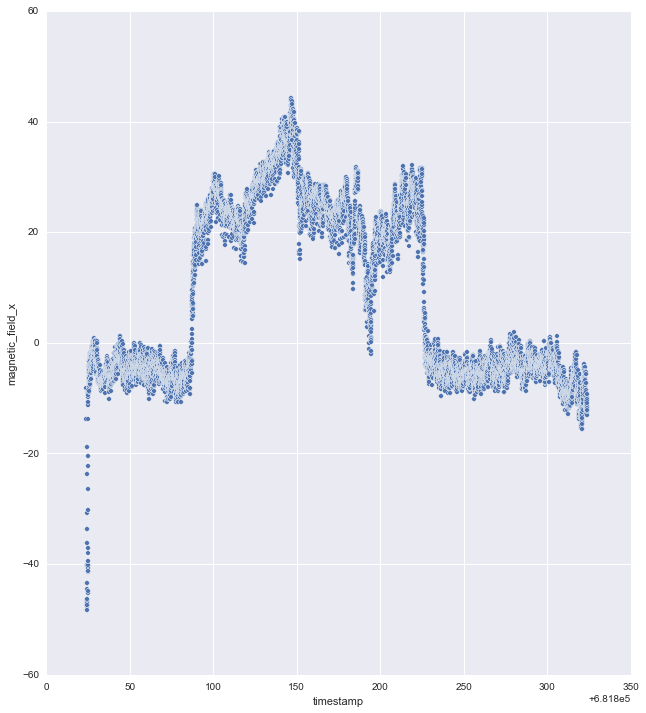

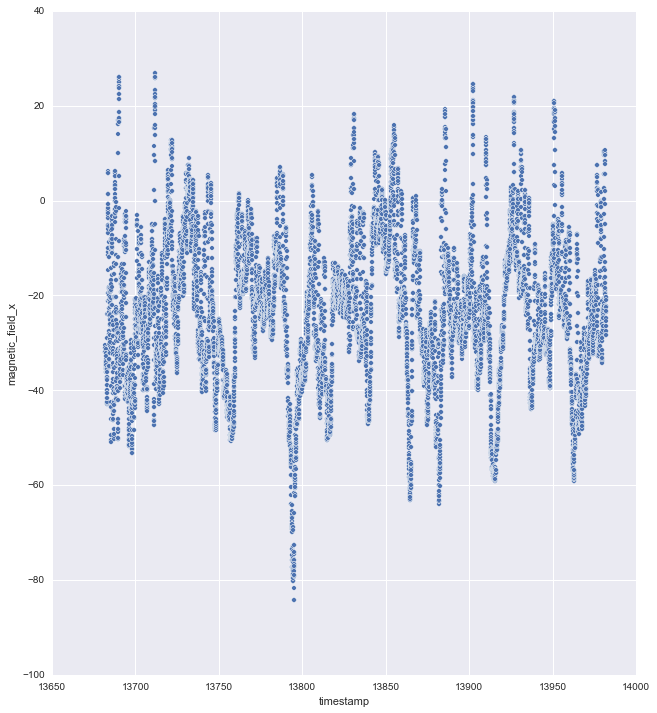

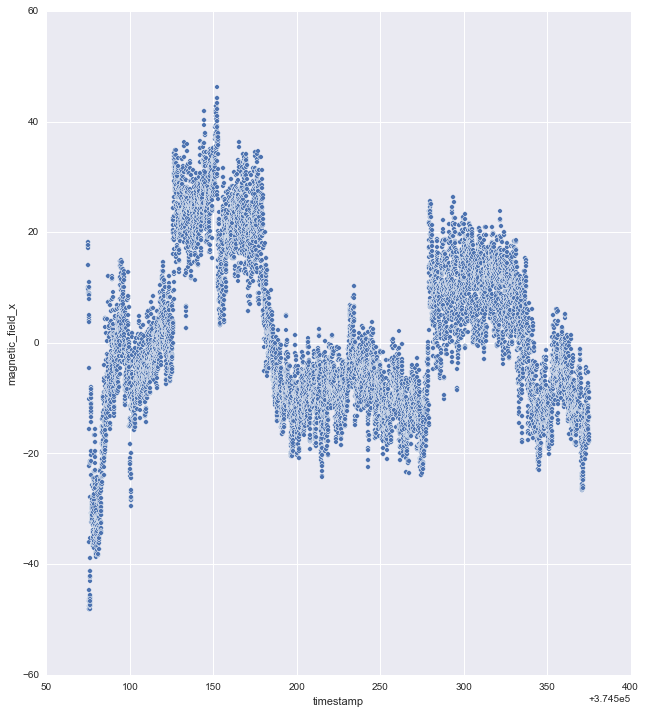

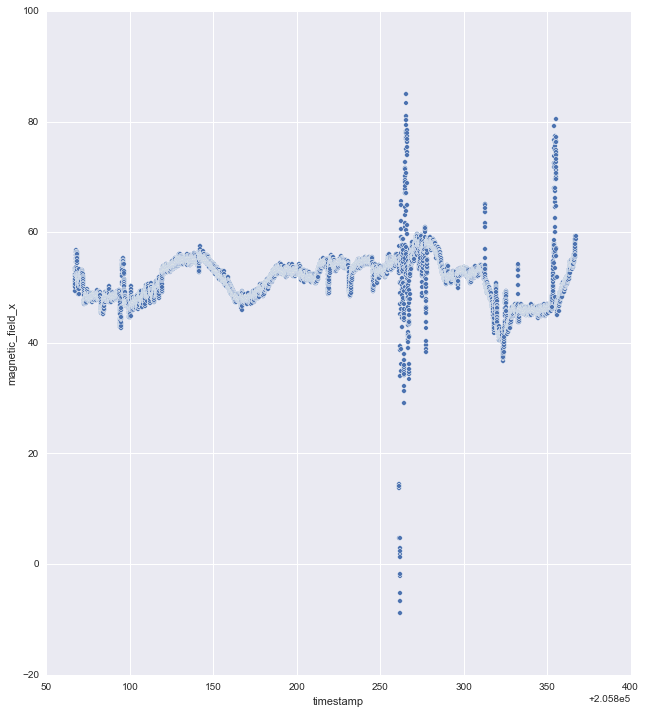

In [22]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_x', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_x', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'magnetic_field_x', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'magnetic_field_x', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_x', size = 10, aspect=0.9)


<h3> Magnetic Field Y </h3>

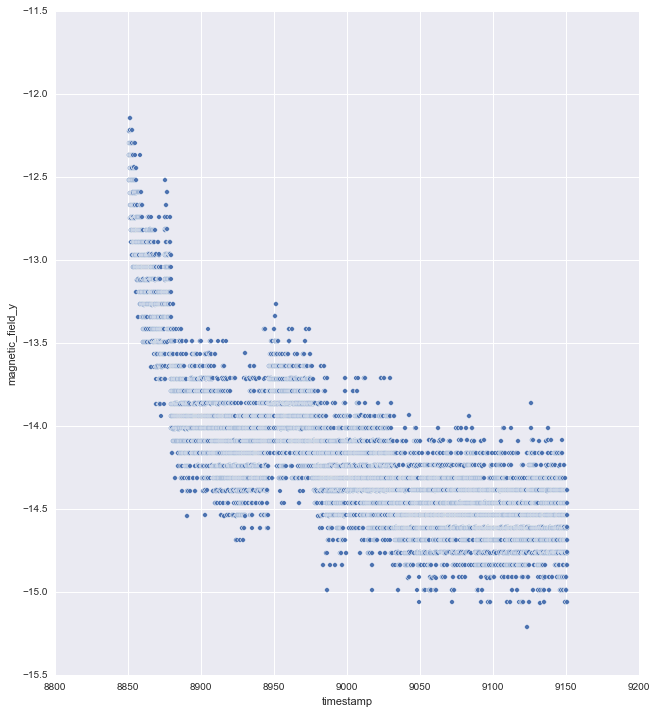

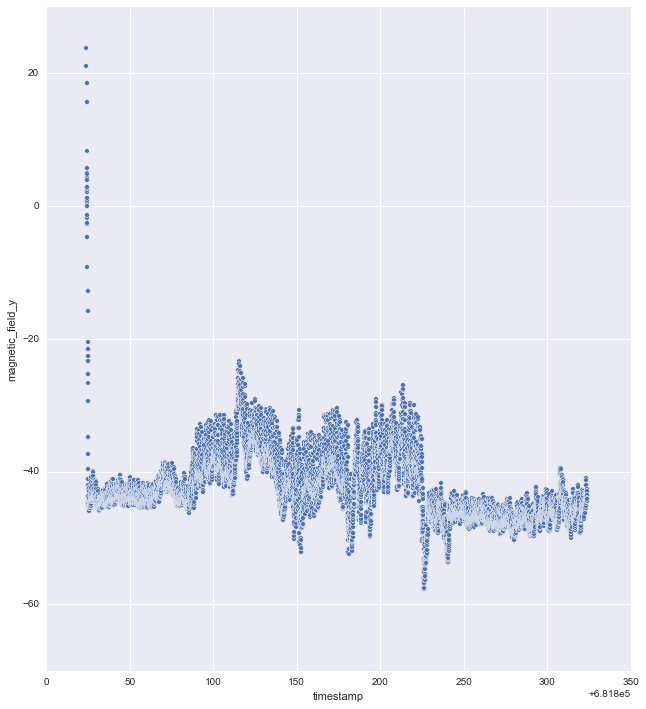

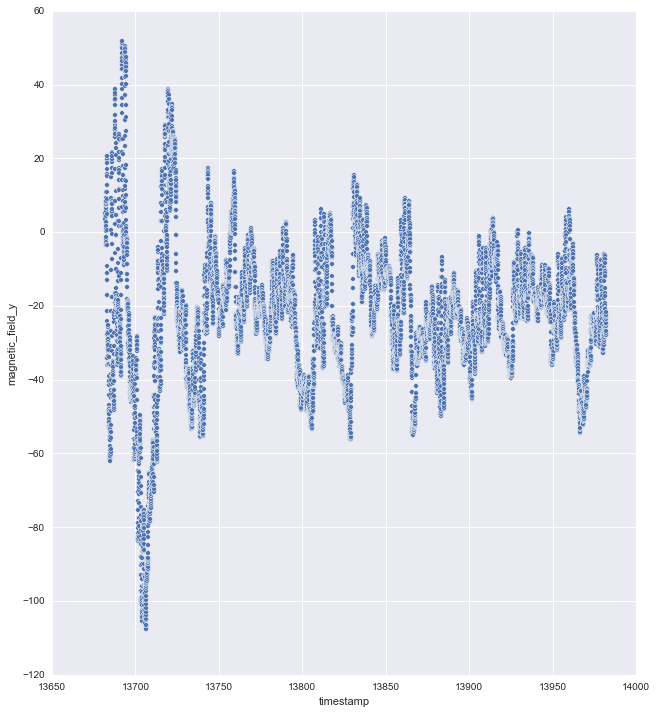

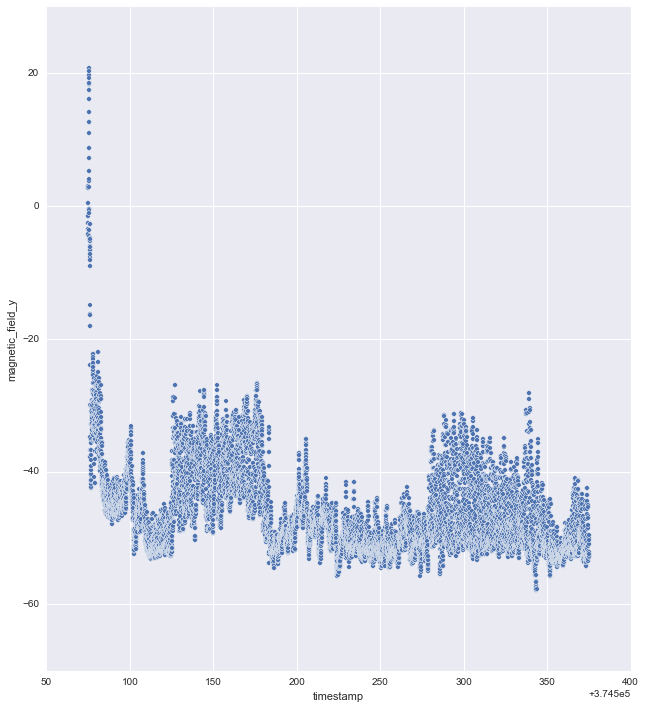

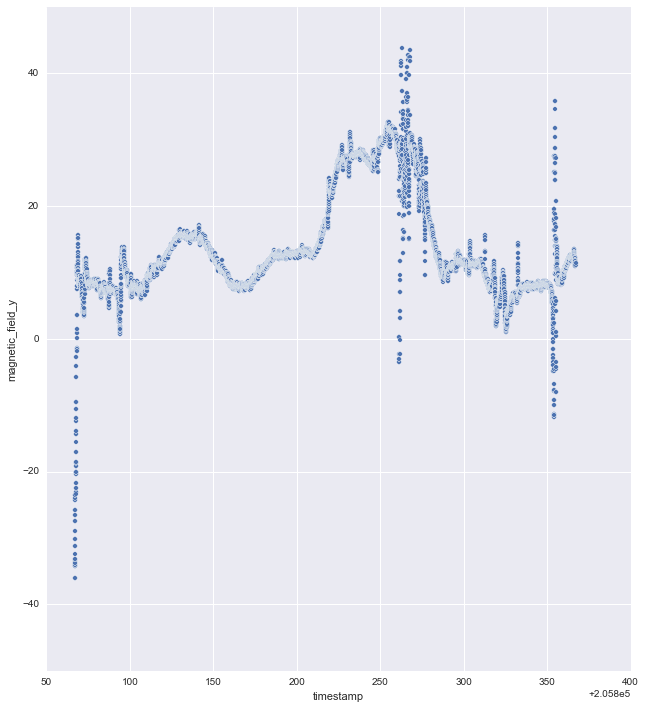

In [23]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_y', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_y', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'magnetic_field_y', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'magnetic_field_y', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_y', size = 10, aspect=0.9)


<h3> Magnetic Field Z </h3>

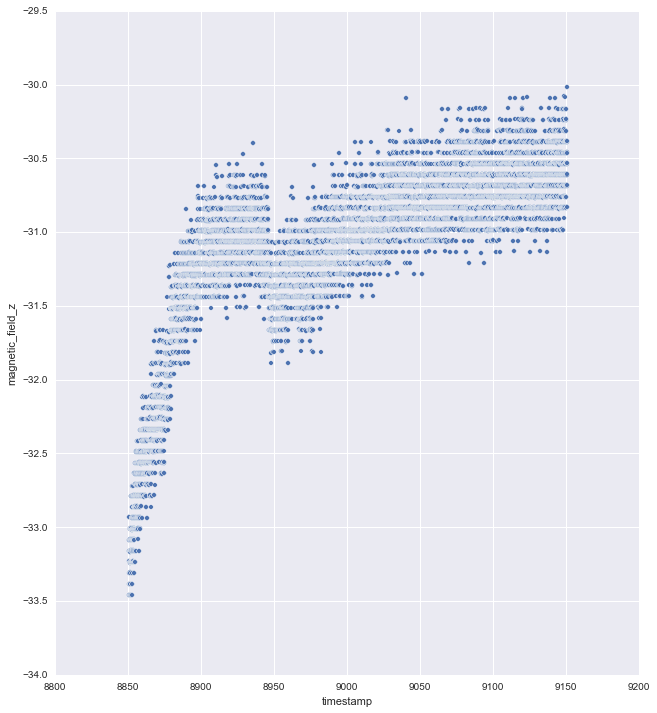

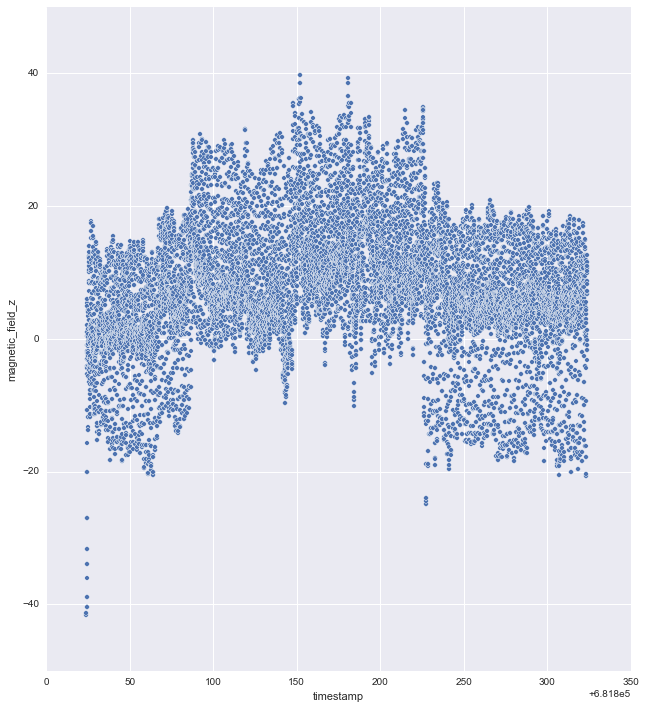

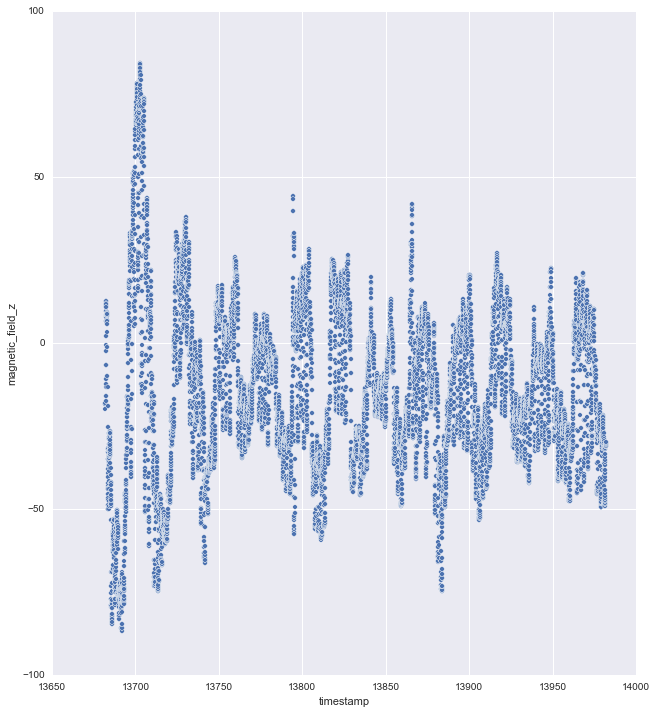

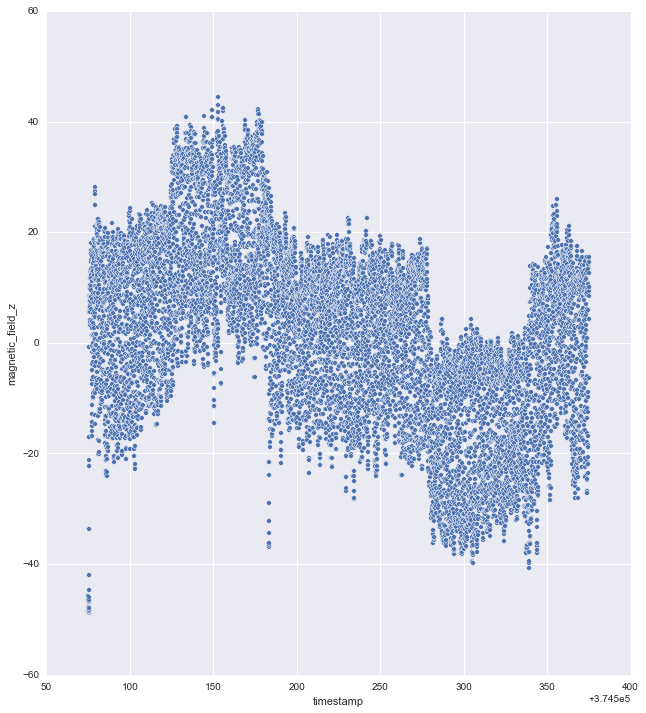

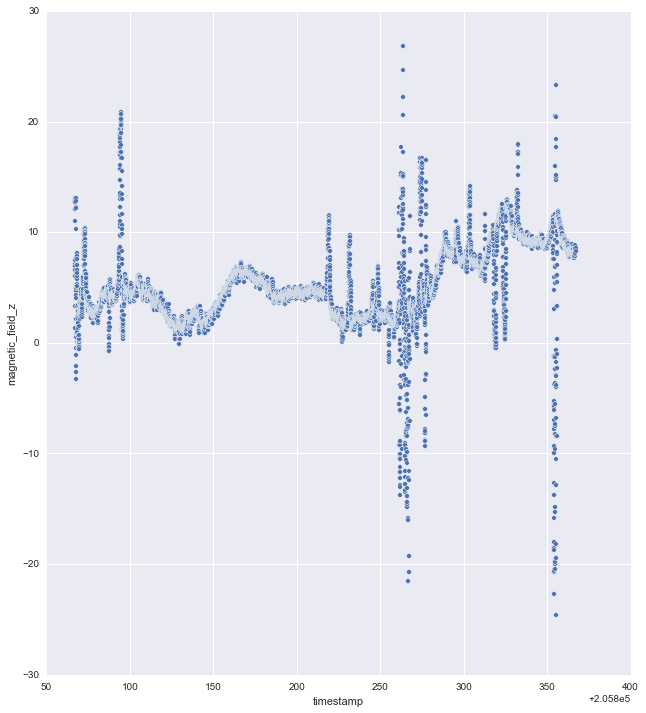

In [24]:
sb.pairplot(sittingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_z', size = 10, aspect=0.9)
sb.pairplot(walkingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_z', size = 10, aspect=0.9)
sb.pairplot(stairsdata, x_vars = 'timestamp', y_vars = 'magnetic_field_z', size = 10, aspect=0.9)
sb.pairplot(runningdata, x_vars = 'timestamp', y_vars = 'magnetic_field_z', size = 10, aspect=0.9)
sb.pairplot(drivingdata, x_vars = 'timestamp', y_vars = 'magnetic_field_z', size = 10, aspect=0.9)


<h2> Feature Generation </h2>

<p> By eyeballing, we can see from all the above comparative graphs that the most distinct set of graphs occur for the readings of Attitude Pitch, Attitude Yaw, Magnetic Field X, Y and Z. Thus, we will try our first set of features by taking the mean of all these values for each ten second segment and then running different classifiers on them. </p>


In [25]:
#X'mean_attitude_pitch','mean_attitude_yaw', 'mean_mf_x', 'mean_mf_y', 'mean_mf_z'
X = []
s = 0
e = 0

for i in range(1, 121):
    e = i * 1000
    a_p = traindata.iloc[s:e,2]
    a_y = traindata.iloc[s:e,3]
    m_x = traindata.iloc[s:e,12]
    m_y = traindata.iloc[s:e,13]
    m_z = traindata.iloc[s:e,14]
    X.append([a_p.mean(),a_y.mean(), m_x.mean(), m_y.mean(), m_z.mean()])
    s = s + 1000

X_ = np.asarray(X)
X_.shape

(120, 5)

<p> We will now create our test data set. </p>

In [26]:
Xtest = []
a = 0
b = 0

for i in range (1, 31):
    b = i * 1000
    a_ptest = testdata.iloc[a:b,2]
    a_ytest = testdata.iloc[a:b, 3]
    m_xtest = testdata.iloc[a:b, 12]
    m_ytest = testdata.iloc[a:b, 13]
    m_ztest = testdata.iloc[a:b, 14]
    Xtest.append([a_ptest.mean(),a_ytest.mean(),m_xtest.mean(),m_ytest.mean(),m_ztest.mean()])
    a = a + 1000

Xtest_ = np.asarray(Xtest)
Xtest_.shape

(30, 5)

<p> We now have our features ready for training. However, we need to populate our response array. </p>

In [27]:
Y = []

#Sitting - 0, Walking - 1, Stairs - 2, Running - 3, Driving - 4

for i in range (0, 120):
    if i < 24:
        Y.append(0)
    elif 24 <= i < 48:
        Y.append(1)
    elif 48 <= i < 72:
        Y.append(2)
    elif 72 <= i < 96:
        Y.append(3)
    else:
        Y.append(4)

Y_ = np.asarray(Y)
Y_.shape

(120,)

<p> We also need to create a response array for our test dataset for scoring results on our test data. </p>

In [28]:
Ytest = []

for j in range (0, 30):
    if j < 6:
        Ytest.append(0)
    elif 6 <= j < 12:
        Ytest.append(1)
    elif 12 <= j < 18:
        Ytest.append(2)
    elif 18 <= j < 24:
        Ytest.append(3)
    else:
        Ytest.append(4)
        
Ytest_ = np.asarray(Ytest)
Ytest_.shape



(30,)

<p> We have now generated X and Y datasets for training our classifiers. We will now proceed to train them and then subsequently test our classifiers. </p>

<h2> Logistic Regression </h2>

In [36]:
cl_lr = LogisticRegression()

LR_pred = cl_lr.fit(X_, Y_).predict(Xtest_)
cvscoreLR = cross_validation.cross_val_score(cl_lr, X_, Y_)

print metrics.accuracy_score(Ytest,LR_pred)
print confusion_matrix(Ytest, LR_pred)
print cvscoreLR
print cvscoreLR.mean()


0.866666666667
[[6 0 0 0 0]
 [0 6 0 0 0]
 [1 1 4 0 0]
 [0 2 0 4 0]
 [0 0 0 0 6]]
[ 0.775  1.     0.85 ]
0.875


<p> Logistic Regression classified all Sitting, Walking, and Driving data correctly. It classified 4/6 data points correct for both Stairs and Running. 1 of Stairs' data point was classified as Walking, and another was classified as Sitting. Two out of six Running data points were incorrectly classified as Walking. </p>


<h2> Decision Tree </h2>

In [39]:
cl_dt = tree.DecisionTreeClassifier()

DT_pred = cl_dt.fit(X_,Y_).predict(Xtest_)
cvscoreDT = cross_validation.cross_val_score(cl_dt, X_, Y_)

print metrics.accuracy_score(Ytest, DT_pred)
print confusion_matrix(Ytest, DT_pred)
print cvscoreDT
print cvscoreDT.mean()

0.9
[[6 0 0 0 0]
 [0 5 1 0 0]
 [0 0 6 0 0]
 [0 2 0 4 0]
 [0 0 0 0 6]]
[ 0.7    0.975  0.725]
0.8


<p> Decision Tree classified all data points of Sitting, Stairs and Driving correctly. However, it misclassified one data point of Walking as Stairs and two data points of Running as Walking. </p>


<h2> SVM </h2>

In [41]:
cl_svm = svm.SVC(kernel='linear', C=1.0)

svm_pred = cl_svm.fit(X_,Y_).predict(Xtest_)
cvscoreSVM = cross_validation.cross_val_score(cl_svm, X_, Y_)

print metrics.accuracy_score(Ytest, svm_pred)
print confusion_matrix(Ytest, svm_pred)
print cvscoreSVM
print cvscoreSVM.mean()

0.866666666667
[[6 0 0 0 0]
 [0 6 0 0 0]
 [0 0 6 0 0]
 [0 4 0 2 0]
 [0 0 0 0 6]]
[ 0.8    0.95   0.825]
0.858333333333


<p> SVM classified all data points for Sitting, Walking, Stairs, and Driving correctly. It misclassified FOUR points of running incorrectly. All of those four points were classified as Walking. </p>


<h2> K-Nearest Neighbors </h2>

In [42]:
cl_knn = KNeighborsClassifier(n_neighbors = 3)

knn_pred = cl_knn.fit(X_,Y_).predict(Xtest_)
cvscoreknn = cross_validation.cross_val_score(cl_knn, X_, Y_)

print metrics.accuracy_score(Ytest, knn_pred)
print confusion_matrix(Ytest, knn_pred)
print cvscoreknn
print cvscoreknn.mean()

0.933333333333
[[6 0 0 0 0]
 [0 6 0 0 0]
 [0 0 6 0 0]
 [0 2 0 4 0]
 [0 0 0 0 6]]
[ 0.825  0.9    0.9  ]
0.875


<p> KNN classified all of data points for Sitting, Walking, Stairs and Driving correctly. It misclassified two data points of Running as Walking. </p>


<h1> FFT Based Features </h1>


<p> Intuitively and from various papers, most notably, Kwapisz et. al. "Activity Recognition using Cell Phone Accelerometers", it makes sense that accelerometer data from all three axes should serve as the most crucial data stream in aiding our classifiers. However, due to noise in the data as well as our data set being extremely small, the influence of accelerometer data is negative on the accuracy of our classifiers. To work around this, I will run the accelerometer data through FFT and then back again. Then, I will measure the accuracy of classifiers using the accelerometer data. </p>

In [45]:
#Extract user acc data for all three axes from training set. 

F = []

g = 0
h = 0

for i in range(1, 121):
    h = i * 1000
    uax = traindata.iloc[g:h,9]
    uay = traindata.iloc[g:h,10]
    uaz = traindata.iloc[g:h,11]
    uax_fft = np.abs(sp.fft(uax))
    uay_fft = np.abs(sp.fft(uay))
    uaz_fft = np.abs(sp.fft(uaz))
    F.append([uax_fft.mean(), uay_fft.mean(), uaz_fft.mean()])
    g = g + 1000

F_ = np.asarray(F)
F_.shape


(120, 3)

In [47]:
#Extract user acc data for all three axes from test set.

Ftest = []

t = 0
u = 0

for i in range (1, 31):
    u = i * 1000
    if t != 11000:
        uax = testdata.iloc[t:u,9]
        uay = testdata.iloc[t:u,10]
        uaz = testdata.iloc[t:u,11]
        uax_fft = np.abs(np.fft.fft(uax))
        uay_fft = np.abs(np.fft.fft(uay))
        uaz_fft = np.abs(np.fft.fft(uaz))
        Ftest.append([uax_fft.mean(), uay_fft.mean(), uaz_fft.mean()])
        t = t + 1000
    else:
        uax = testdata.iloc[t-1000:u-1000,9]
        uay = testdata.iloc[t-1000:u-1000,10]
        uaz = testdata.iloc[t-1000:u-1000, 11]
        uax_fft = np.abs(np.fft.fft(uax))
        uay_fft = np.abs(np.fft.fft(uay))
        uaz_fft = np.abs(np.fft.fft(uaz))
        Ftest.append([uax_fft.mean(), uay_fft.mean(), uaz_fft.mean()])
        t = t + 1000

Ftest_ = np.asarray(Ftest)
Ftest_.shape

np.isfinite(Ftest_)

array([[ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True]], dtype=bool)

<p> Unexplained error. :( One of my data points in the Test data set is NaN. Unresolved. </p>
<p> EDIT: Following Jeff's perennially sage counsel, I singled out the particular data point that was an NaN and switched it with a copy of a previous data point belonging in the same category. </p>

<h2> Classifiers with FFT Data </h2>

<h3> Logistic Regression </h3>

In [48]:
cl_lr = LogisticRegression()

LR_fft = cl_lr.fit(F_, Y_).predict(Ftest_)
cvscoreLRfft = cross_validation.cross_val_score(cl_lr, F_, Y_)

print metrics.accuracy_score(Ytest, LR_fft)
print confusion_matrix(Ytest, LR_fft)
print cvscoreLRfft
print cvscoreLRfft.mean()

0.933333333333
[[5 1 0 0 0]
 [0 6 0 0 0]
 [0 1 5 0 0]
 [0 0 0 6 0]
 [0 0 0 0 6]]
[ 0.95   1.     0.975]
0.975


<p> Logistic Regression classifies all the data points of Walking, Running and Driving correctly. It misclassified one data point of Sitting as Walking, and one data point of Stairs incorrectly as Walking as well. In total, it misclassified these points out of thirty. </p>



<h3> Decision Tree </h3>

In [49]:
cl_dt = tree.DecisionTreeClassifier()

DT_fft = cl_dt.fit(F_,Y_).predict(Ftest_)
cvscoreDTfft = cross_validation.cross_val_score(cl_dt, F_, Y_)

print metrics.accuracy_score(Ytest, DT_fft)
print confusion_matrix(Ytest, DT_fft)
print cvscoreDTfft
print cvscoreDTfft.mean()

0.933333333333
[[5 0 0 0 1]
 [0 6 0 0 0]
 [0 0 5 0 1]
 [0 0 0 6 0]
 [0 0 0 0 6]]
[ 0.95  1.    0.95]
0.966666666667


<p> The Decision Tree classified 27/30 data points correctly. It classified all data points of Walking, Running and Driving correctly. It misclassified one data point of Sitting as Driving and two data points of Stairs, with one being classified as Walking and the other being categorized as Driving. </p>



<h3> SVM </h3>

In [50]:
cl_svm = svm.SVC(kernel='linear', C=1.0)

svm_predfft = cl_svm.fit(F_,Y_).predict(Ftest_)
cvscoreSVMfft = cross_validation.cross_val_score(cl_svm, F_, Y_)

print metrics.accuracy_score(Ytest, svm_predfft)
print confusion_matrix(Ytest, svm_predfft)
print cvscoreSVMfft
print cvscoreSVMfft.mean()

0.933333333333
[[5 0 0 0 1]
 [0 6 0 0 0]
 [0 1 5 0 0]
 [0 0 0 6 0]
 [0 0 0 0 6]]
[ 0.95  1.    1.  ]
0.983333333333


<p> SVM classified 28/30 points correctly. It classified all of Walking, Running and Driving while it misclassified one of Sitting's data points as Driving and one of Stairs data point as Walking. </p>



<h3> KNN </h3>


In [51]:
cl_knn = KNeighborsClassifier(n_neighbors = 5)

knn_predfft = cl_knn.fit(F_,Y_).predict(Ftest_)
cvscoreknnfft = cross_validation.cross_val_score(cl_knn, F_, Y_)

print metrics.accuracy_score(Ytest, knn_predfft)
print confusion_matrix(Ytest, knn_predfft)
print cvscoreknnfft
print cvscoreknnfft.mean()

0.933333333333
[[5 0 0 0 1]
 [0 6 0 0 0]
 [0 1 5 0 0]
 [0 0 0 6 0]
 [0 0 0 0 6]]
[ 0.95  1.    1.  ]
0.983333333333


<p> KNN classified 28/30 points accurately. It classified Walking, Running and Driving correctly. It misclassified one of Sitting's data points as Driving and one of Stairs data points as Walking. </p>



<h2> Summary and Observations </h2>

<h3> Feature Set 1 </h3>

Attitude Pitch, Attitude Yaw, MFX, MFY, MFZ.

- Sitting and Driving classified correctly by all classifiers. Sitting is overclassified once by LR, while Driving has a perfect record. <br> <br>

- Walking was classified correctly by all but Decision Trees. <br> <br>

- However, other data points were often confused for Walking. 83.33% of the misclassifications were for Walking. Clearly, our feature set and chosen classifiers are biased towards Walking. <br> <br>

- Running was most frequently misclassified. Interestingly, Running was always misclassified as Walking by all the classifiers, with varying degrees of misclassification. Misclassification % for Running as Walking was: LR - 33.33%, DT - 33.33%, SVM - 66.66%, KNN - 33%. <br> <br>

- Stairs was the second most misclassified activity. Logistic Regression, with a misclassification rate of 33.33%, misclassified one data point as Walking and the other as Sitting. <br> <br>

- Walking was the last and the least misclassified. Decision Trees misclassified one Walking data point as Stairs. 

<h4> What could we hypothesize from these observations? </h4>

- Sitting and Driving have the most distinct pattern of values (both shape of graph and the range of values) for our feature set. This is evident in their graphs. <br> <br>

- Walking's range of values as well as shape of graph bears the most resemblance with other activities. It most resembles Running, and slightly resembles Stairs. Again, this is evident from the shape and range of values for their graphs. <br> <br>

- Given that it's clear that the similarities and dissimilarities in the graphs can explain misclassifications as well as overclassifications, we can also imagine why particular classifiers were the most effective and others weren't. For instance, kNN works best because it is a more "weighted" approach and thus, less prone to mistaking similarity in values for association with a particular category. The SVM is the least effective approach as similarities in 2D geometry ultimately affect the accuracy of the hyperplane. The considerable similarities between Running and Walking's graphs explain the rampant misclassification of four Running points as Walking. Again, given the similarity of inputs and the known mechanism of action for Logistic Regression that depends on previous inputs and their respective probabilities of belonging in a particular category (or not), it is clear why Logistic Regression makes the misclassifications it does. Classifying two Running Data points as Walking, one Stairs data point as Walking, and one stairs data point as Sitting. Because of proximity in values and its reliance on thresholds for categorization, we also understand why Decision Tree misclassified one Walking data point as Stairs and two Running data points as Walking. <br> <br>

- Ways to improve these models? The way to improve these models would be to come up with features that separate the close knit pairs, especially Walking and Running, while maintaing the distinction between other activities. Thus, focusing on picking features that clearly distinguish Walking and Running but may cause blurring of lines between other features is counterproductive. (From eyeballing estimation, the only such "simple" feature that seems discernible, tentatively speaking, is the max - min of rotation rate.)





<h3> Feature Set 2: FFT w/UAX, UAY, and UAZ </h3>

- Walking, Running and Driving classified correctly by all classifiers. <br> <br>

- Walking and Driving were also overclassified by all classifiers. Five overclassifications were made for Walking and four were made for Driving. <br> <br>

- Stairs was the most frequently misclassified activity, followed by Sitting Still. For Stairs, misclassification rates were: LR: 16.67%, DT: 33.33%, SVM: 16.67%, KNN: 16.67%. For Sitting Still, misclassification rates for all classifiers was 16.67%. <br> <br>

- Sitting was misclassified as Driving a total of 3 out of 4 times. One of the 4 times it was misclassified as Walking. <br> <br>

- Stairs was misclassified as Walking for a total of 4 out of 5 times. One of the 5 times it was misclassified as Driving. <br> <br>

- Running was the most distinctive, perfectly classified activity. Intuitively, we see that Sitting was mostly confused with Driving, while Walking was mostly confused with Stairs. In both these cases, the pairs of activities can empirically be said to share acceleration along two out of three axes, while differing along one of the acceleration axes. This is the distinction that needs to be enhanced by using more features (while maintaing the quality of other distinctions) to help the model reach close to perfect accuracy. <br> <br>

<h2> BONUS: HEARTRATE </h2>

<h3> Hypothesis </h3>

<p> If the phone is placed on the cavity of the chest, the best metric to measure heartrate is User Acceleration along the Z axis. This is because the heart pushes against the surface of the chest, thus cause "vertical" motion (when the person is lying down flat). This causes continuous, nearly periodic changes in the data, which can be then cleaned up to make a prediction about the heart rate. </p>

<p> For the respiratory rate, it seems that while User Acceleration along the Z axis might still be a good option to use, a better option might be Attitude Yaw. Similar to the logic mentioned above, if a person lies flat and the phone is placed flat on their stomach, the change in position will be most registered on the Z Axis (as the X and Y axes are perpendicular to the direction of motion while Z axis is the only one parallel to it; hence, the displacement vector is best measured in this direction.) Similar to heartrate, some cleaning of data using </p>

<p> We can use a band-pass filter to reduce/ideally eliminate noise/extreme data points on both the lower and higher ends, and then using the remaining data to estimate periodic wavelengths. Once we have a rough periodic waveform, we can estimate "one" beat or "one" breath by width estimation using the values of the peaks and valleys that recur. This, extrapolated over a range of time, such as a minute, can give us an estimate of heart beats per minute and/or breaths per minute. </p>

<h3> Experiment </h3>

<p> For Heartrate: </p>

In [52]:
heartratedata.describe()

,timestamp,attitude_roll,attitude_pitch,attitude_yaw,rotation_rate_x,rotation_rate_y,rotation_rate_z,gravity_x,gravity_y,gravity_z,user_acc_x,user_acc_y,user_acc_z,magnetic_field_x,magnetic_field_y,magnetic_field_z
count,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000,19606.000000
mean,343785.598595,-0.042925,-0.028609,-2.501379,0.000112,0.000038,-0.000055,-0.042894,0.028605,-0.998657,-0.000021,-0.000138,-0.002731,-9.947628,7.884113,-51.542917
std,56.563969,0.003903,0.003425,0.001382,0.024943,0.041590,0.009738,0.003902,0.003423,0.000101,0.004728,0.009582,0.013294,0.249272,0.208236,0.239363
min,343687.630000,-0.051494,-0.039361,-2.507234,-0.460842,-0.317505,-0.137542,-0.051455,0.001776,-0.999241,-0.039475,-0.032436,-0.083896,-11.343384,6.788467,-52.257507
25%,343736.612500,-0.045902,-0.030977,-2.502326,-0.010635,-0.010737,-0.004412,-0.045868,0.026080,-0.998726,-0.002060,-0.005275,-0.006021,-10.143097,7.762650,-51.728210
50%,343785.595000,-0.043589,-0.028357,-2.501769,0.001017,0.001882,-0.000060,-0.043559,0.028353,-0.998657,-0.000090,0.000041,-0.002805,-9.920059,7.912567,-51.577148
75%,343834.577500,-0.039925,-0.026083,-2.500495,0.011310,0.012007,0.004568,-0.039898,0.030972,-0.998586,0.002033,0.005537,0.000253,-9.769135,8.062531,-51.356079
max,343883.560000,-0.028890,-0.001776,-2.495977,0.672938,0.230697,0.042385,-0.028869,0.039351,-0.998345,0.025159,0.059749,0.068852,-9.091812,8.663208,-50.533630


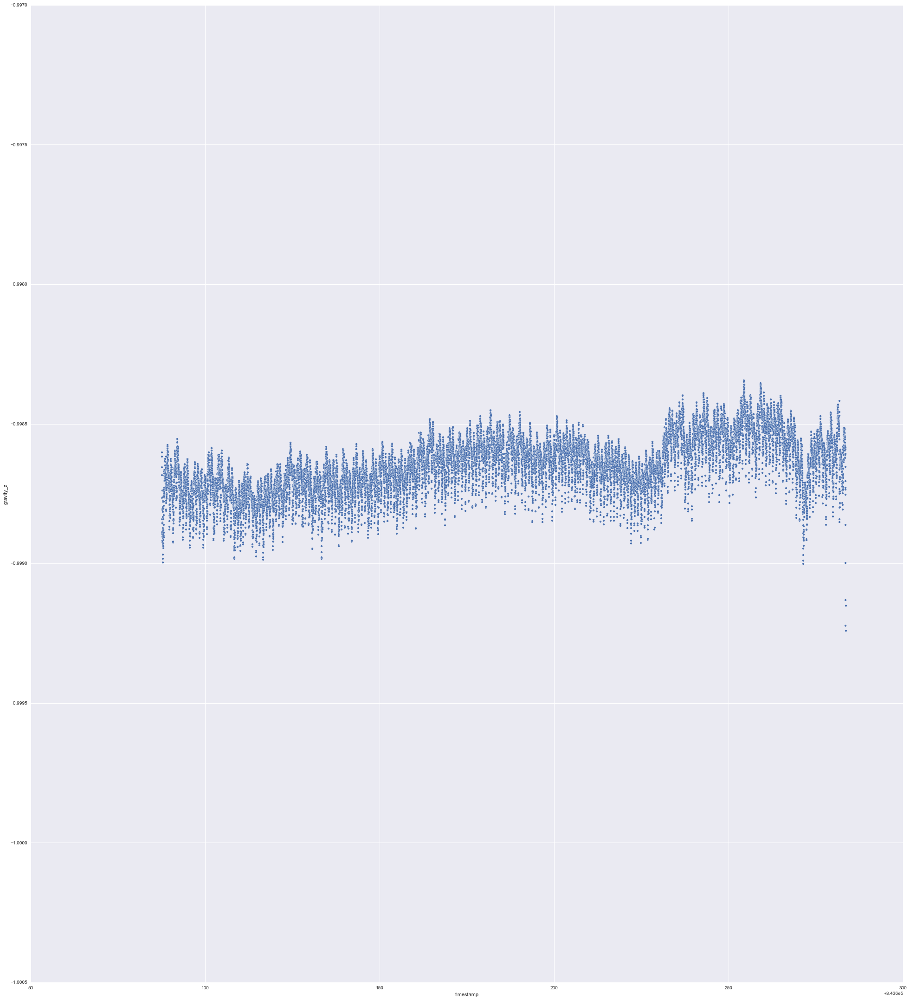

In [53]:
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'attitude_roll', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'attitude_yaw', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'rotation_rate_x', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'rotation_rate_y', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'rotation_rate_z', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'gravity_x', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'gravity_y', size = 10, aspect=0.9)
sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'gravity_z', size = 30, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'user_acc_x', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'user_acc_y', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'user_acc_z', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'magnetic_field_x', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'magnetic_field_y', size = 10, aspect=0.9)
#sb.pairplot(heartratedata, x_vars = 'timestamp', y_vars = 'magnetic_field_z', size = 10, aspect=0.9)

<p> Turns out Gravity Z, and not user acceleration along Z is a better metric. However, acceleration remains the best metric! (Because displacement in any form would not be shaped appropriately enough for our usage.) Statistically, gravity z has the lowest standard deviation which also makes it a favorable candidate. </p>

<h3> Test Stuff Plz Ignore </h3>

In [68]:
#FFT

import numpy as np
import scipy as sp

gravz = heartratedata['gravity_z']
grazfft = np.abs(np.fft.fft(gravz))



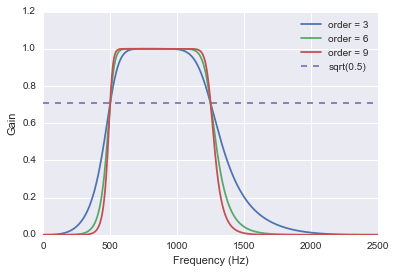

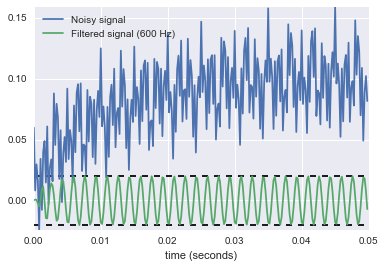

In [55]:
from scipy.signal import butter, lfilter

gravz = heartratedata['gravity_z']
gravzfft = np.abs(sp.fft(gravz))
timestamp = heartratedata['timestamp']

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

if __name__ == "__main__":
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz
    
    # Sample rate and desired cutoff frequencies (in Hz).
    fs = 5000.0
    lowcut = 500.0
    highcut = 1250.0
    
    # Plot the frequency response for a few different orders.
    plt.figure(1)
    plt.clf()
    for order in [3, 6, 9]:
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        w, h = freqz(b, a, worN=2000)
        plt.plot((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)
    
    plt.plot([0, 0.5 * fs], [np.sqrt(0.5), np.sqrt(0.5)],
             '--', label='sqrt(0.5)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')
    
    # Filter a noisy signal.
    T = 0.05
    nsamples = T * fs
    t = np.linspace(0, T, nsamples, endpoint=False)
    a = 0.02
    f0 = 600.0
    x = 0.1 * np.sin(2 * np.pi * 1.2 * np.sqrt(t))
    x += 0.01 * np.cos(2 * np.pi * 312 * t + 0.1)
    x += a * np.cos(2 * np.pi * f0 * t + .11)
    x += 0.03 * np.cos(2 * np.pi * 2000 * t)
    plt.figure(2)
    plt.clf()
    plt.plot(t, x, label='Noisy signal')
    
    y = butter_bandpass_filter(x, lowcut, highcut, fs, order=6)
    plt.plot(t, y, label='Filtered signal (%g Hz)' % f0)
    plt.xlabel('time (seconds)')
    plt.hlines([-a, a], 0, T, linestyles='--')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc='upper left')
    
    plt.show()
    

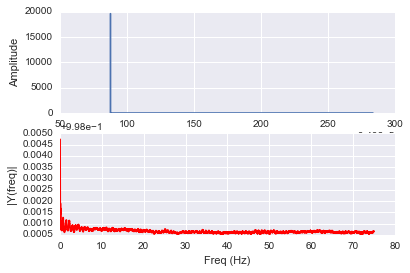

In [63]:


from numpy import sin, linspace, pi
from pylab import plot, show, title, xlabel, ylabel, subplot
from scipy import fft, arange

gravz = heartratedata['gravity_z']
gravzfft = np.abs(sp.fft(gravz))
timestamp = heartratedata['timestamp']

def plotSpectrum(y,Fs):
 """
 Plots a Single-Sided Amplitude Spectrum of y(t)
 """
 n = len(y) # length of the signal
 k = arange(n)
 T = n/Fs
 frq = k/T # two sides frequency range
 frq = frq[range(n/2)] # one side frequency range

 Y = fft(y)/n # fft computing and normalization
 Y = Y[range(n/2)]
 
 plot(frq,abs(Y),'r') # plotting the spectrum
 xlabel('Freq (Hz)')
 ylabel('|Y(freq)|')

Fs = 150.0;  # sampling rate
Ts = 1.0/Fs; # sampling interval
t = timestamp # time vector

ff = 5;   # frequency of the signal
y = gravzfft

subplot(2,1,1)
plot(t,y)
xlabel('Time')
ylabel('Amplitude')
subplot(2,1,2)
plotSpectrum(y,Fs)
show()